In [14]:
import sys
import os

current_directory = os.getcwd()

project_directory = os.path.abspath(os.path.join(current_directory, '..'))
if project_directory not in sys.path:
    sys.path.append(project_directory)

import null_utility
import ML_algorithms
import pandas as pd

dataset_path = os.path.join(project_directory, 'dataset/stroke_data.csv')
df = pd.read_csv(dataset_path)

no_stroke_group = df[df['stroke'] == 0]
stroke_group = df[df['stroke'] == 1]

group_size = 5000

sampled_no_stroke_group = no_stroke_group.sample(n=group_size, random_state=42)
sampled_stroke_group = stroke_group.sample(n=group_size, random_state=42)

df = pd.concat([sampled_no_stroke_group,sampled_stroke_group])
df_to_test = df.copy()
df_to_test.dropna(axis=0,inplace=True)
df_to_test = df_to_test[df_to_test['sex'] >= 0]


df.dropna(axis=0, inplace=True)
df = df[df['sex'] >= 0]

null_utility.drop_negative_age(df)

adding 50% null values to sex feature

ADDING 50% TO FEATURE: SEX
--------------------------------------

 DECISION TREE PREDICTIONS AND RESULTS
---------------------------------------------------
Classification Report on Training Set:
              precision    recall  f1-score   support

           0       1.00      0.97      0.98      3451
           1       0.97      1.00      0.98      3548

    accuracy                           0.98      6999
   macro avg       0.98      0.98      0.98      6999
weighted avg       0.98      0.98      0.98      6999

Classification Report on Test Set - dirty:
              precision    recall  f1-score   support

           0       0.99      0.94      0.97      1548
           1       0.94      0.99      0.96      1452

    accuracy                           0.96      3000
   macro avg       0.97      0.97      0.96      3000
weighted avg       0.97      0.96      0.97      3000

Classification Report on Test Set - original:
              precision    recall  f1-score   support

     

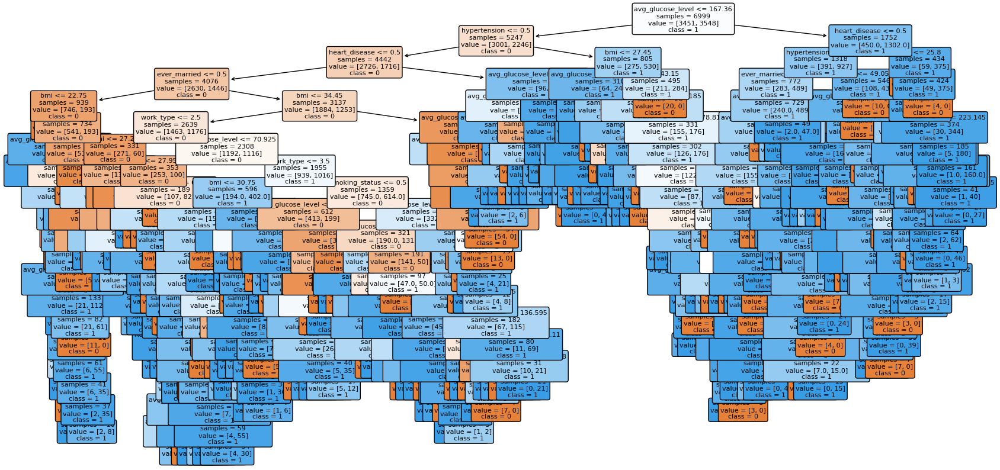

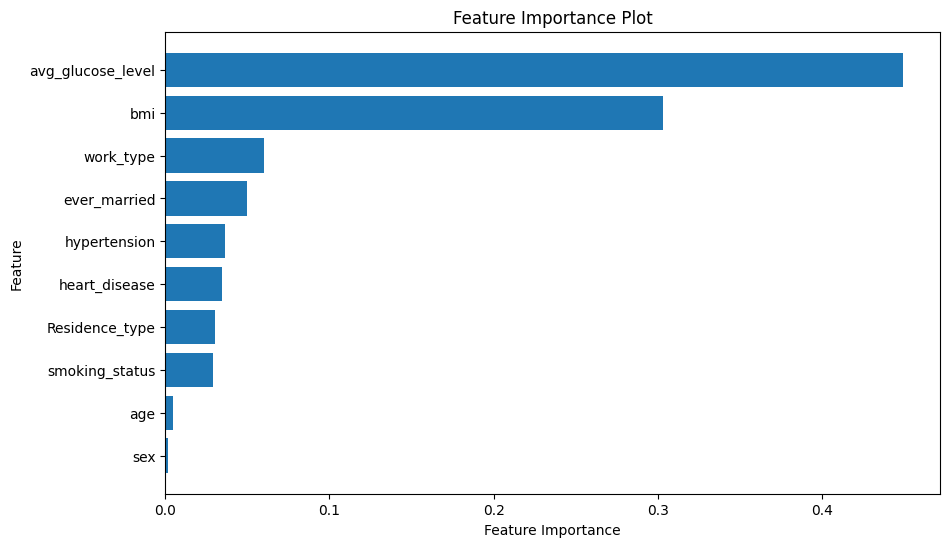

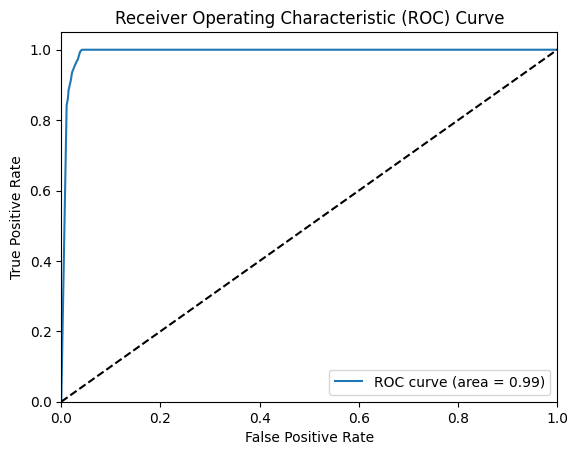

AUC Score: 0.9919465693138628


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Accuracy for each fold: [0.97, 0.96, 0.9514285714285714, 0.9514285714285714, 0.9614285714285714, 0.9528571428571428, 0.9514285714285714, 0.96, 0.9685714285714285, 0.9628040057224606]
Mean accuracy: 0.9589946862865318
95% confidence interval: (0.9539662554614634, 0.9640231171116003)


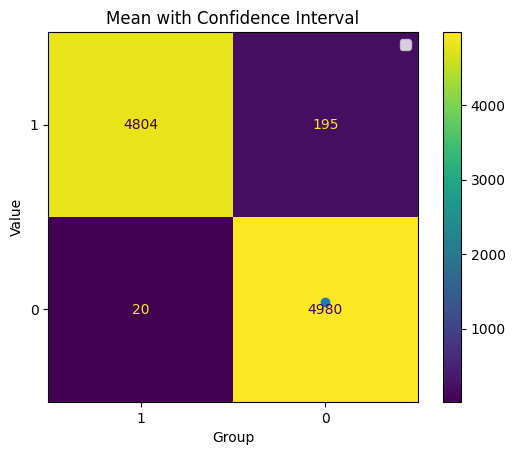


 PRINT HGB PREDICTIONS AND RESULTS
---------------------------------------------------
Fitting 5 folds for each of 50 candidates, totalling 250 fits
search time: 30.975385904312134
Best parameters found:  {'l2_regularization': 0.0, 'learning_rate': 0.2, 'max_depth': 7, 'max_iter': 277, 'min_samples_leaf': 17}
Best score on training data:  1.0
Classification Report on Training Set - dirty:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3451
           1       1.00      1.00      1.00      3548

    accuracy                           1.00      6999
   macro avg       1.00      1.00      1.00      6999
weighted avg       1.00      1.00      1.00      6999

Classification Report on Test Set - dirty:
              precision    recall  f1-score   support

           0       1.00      0.99      0.99      1548
           1       0.99      1.00      0.99      1452

    accuracy                           0.99      3000
   macro avg       

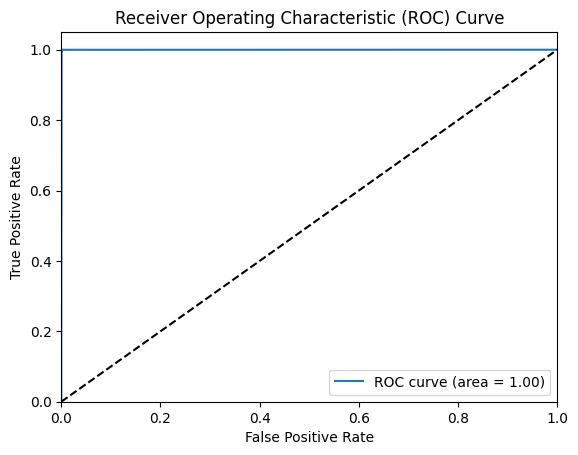

AUC Score: 0.9996721344268853


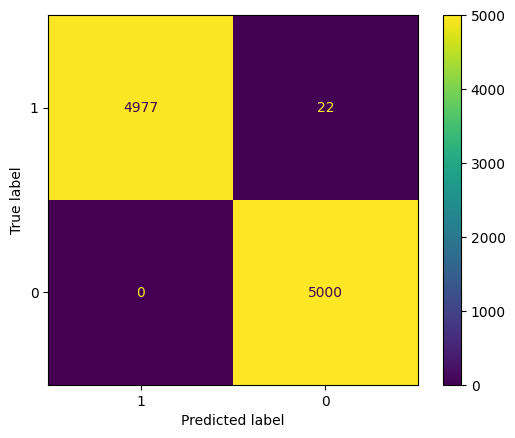

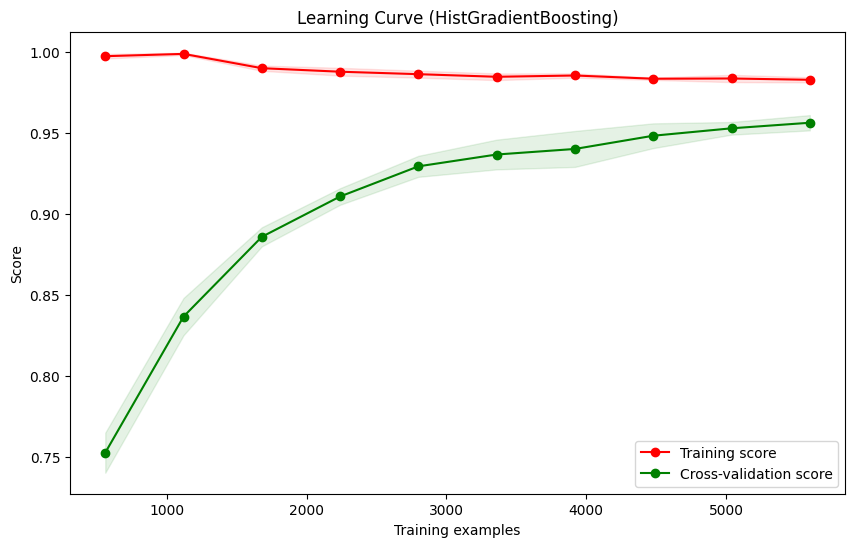

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Accuracy for each fold: [0.9914285714285714, 0.9885714285714285, 0.9885714285714285, 0.98, 0.99, 0.99, 0.9885714285714285, 0.99, 0.9828571428571429, 0.9885550786838341]
Mean accuracy: 0.9878555078683833
95% confidence interval: (0.985295247311246, 0.9904157684255206)


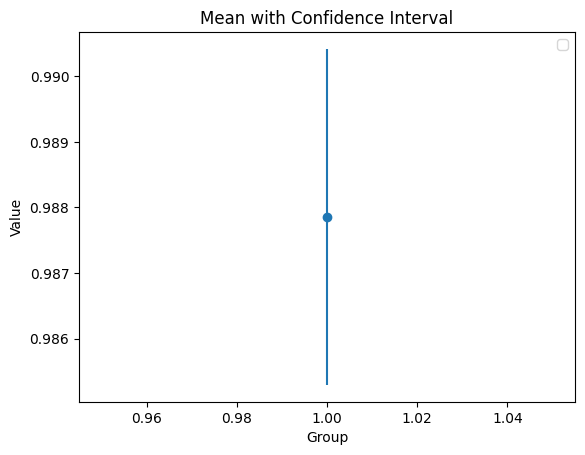

In [2]:
print('ADDING 50% TO FEATURE: SEX')
print('--------------------------------------')
indices, original_values = null_utility.add_null_values(df,'sex', 50)
print('\n DECISION TREE PREDICTIONS AND RESULTS')
print('---------------------------------------------------')
decision_tree = ML_algorithms.train_decision_tree_model(df, df_to_test)
ML_algorithms.k_fold_cross_validation_dt(decision_tree,df)
    
print('\n PRINT HGB PREDICTIONS AND RESULTS')
print('---------------------------------------------------')
hgb = ML_algorithms.train_hist_gradient_boosting_model(df, df_to_test)
ML_algorithms.k_fold_cross_validation_dt(hgb,df) 
    
df.loc[indices, 'sex'] = original_values

adding 50% null values to age feature

ADDING 50% TO FEATURE: AGE
--------------------------------------

 DECISION TREE PREDICTIONS AND RESULTS
---------------------------------------------------
Classification Report on Training Set:
              precision    recall  f1-score   support

           0       1.00      0.97      0.99      3451
           1       0.97      1.00      0.99      3548

    accuracy                           0.99      6999
   macro avg       0.99      0.99      0.99      6999
weighted avg       0.99      0.99      0.99      6999

Classification Report on Test Set - dirty:
              precision    recall  f1-score   support

           0       1.00      0.94      0.97      1548
           1       0.94      1.00      0.97      1452

    accuracy                           0.97      3000
   macro avg       0.97      0.97      0.97      3000
weighted avg       0.97      0.97      0.97      3000

Classification Report on Test Set - original:
              precision    recall  f1-score   support

     

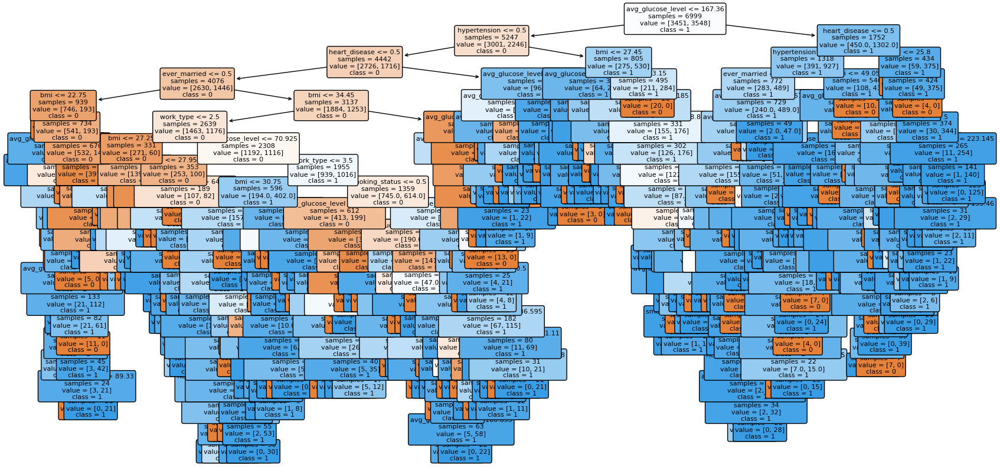

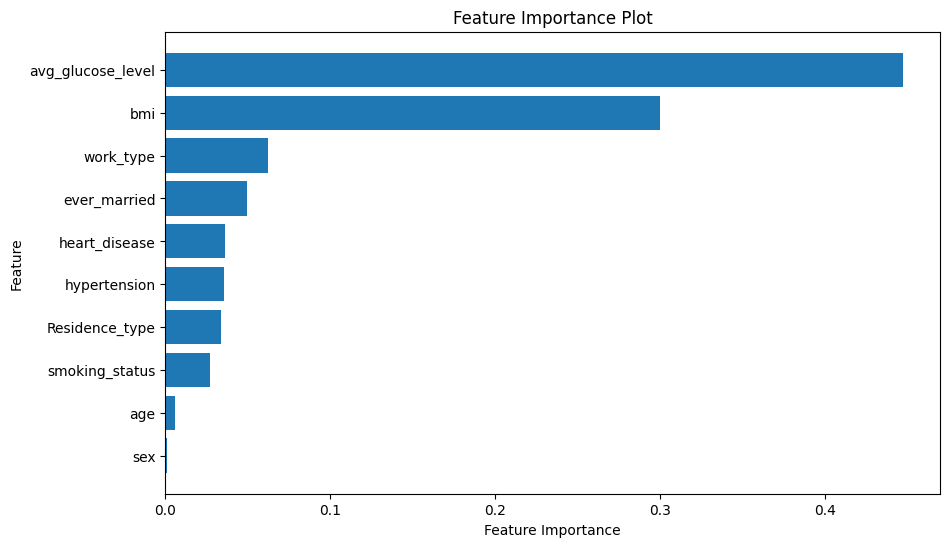

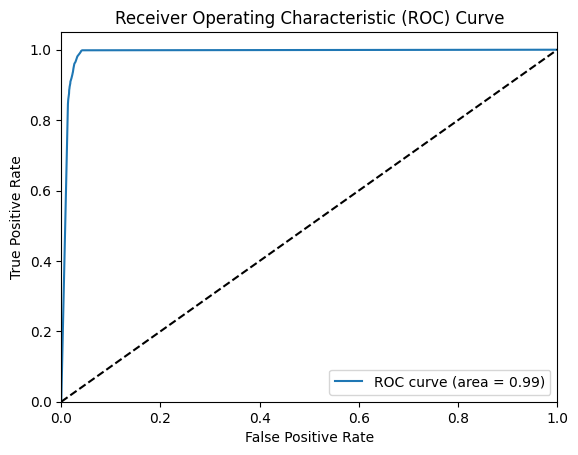

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


AUC Score: 0.9900780356071214
Accuracy for each fold: [0.95, 0.94, 0.9428571428571428, 0.9642857142857143, 0.9685714285714285, 0.9528571428571428, 0.9671428571428572, 0.9628571428571429, 0.9671428571428572, 0.9542203147353362]
Mean accuracy: 0.9569934600449622
95% confidence interval: (0.9494909202851542, 0.9644959998047702)


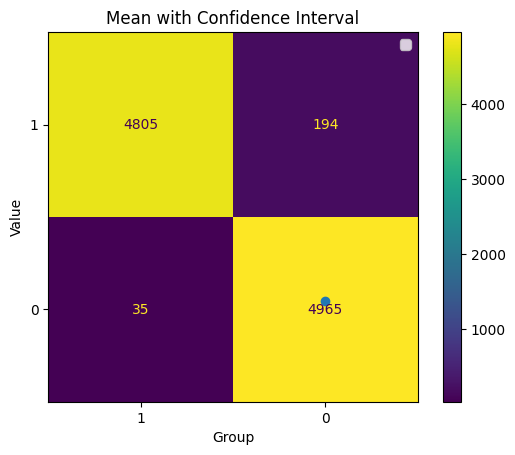


 PRINT HGB PREDICTIONS AND RESULTS
---------------------------------------------------
Fitting 5 folds for each of 50 candidates, totalling 250 fits
search time: 28.19547986984253
Best parameters found:  {'l2_regularization': 0.2, 'learning_rate': 0.1, 'max_depth': 8, 'max_iter': 316, 'min_samples_leaf': 4}
Best score on training data:  1.0
Classification Report on Training Set - dirty:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3451
           1       1.00      1.00      1.00      3548

    accuracy                           1.00      6999
   macro avg       1.00      1.00      1.00      6999
weighted avg       1.00      1.00      1.00      6999

Classification Report on Test Set - dirty:
              precision    recall  f1-score   support

           0       1.00      0.98      0.99      1548
           1       0.98      1.00      0.99      1452

    accuracy                           0.99      3000
   macro avg       0.

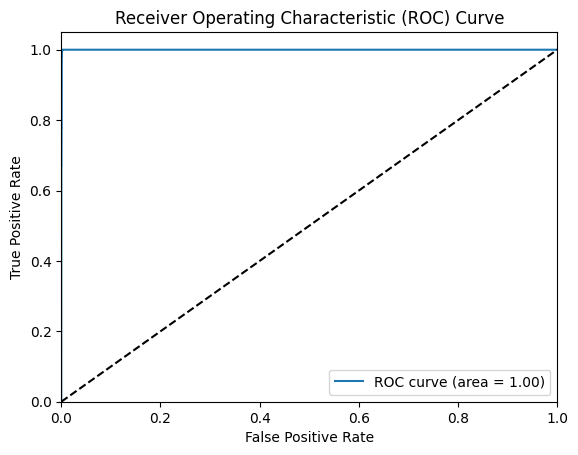

AUC Score: 0.999595199039808


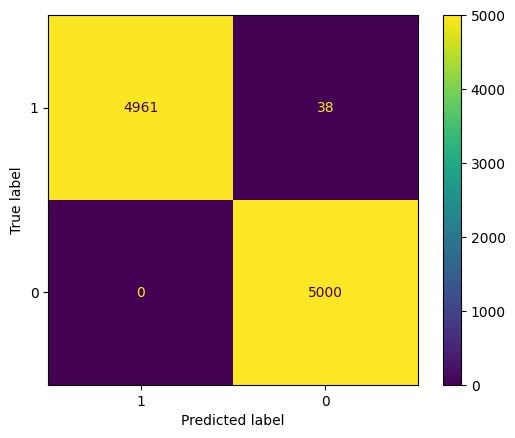

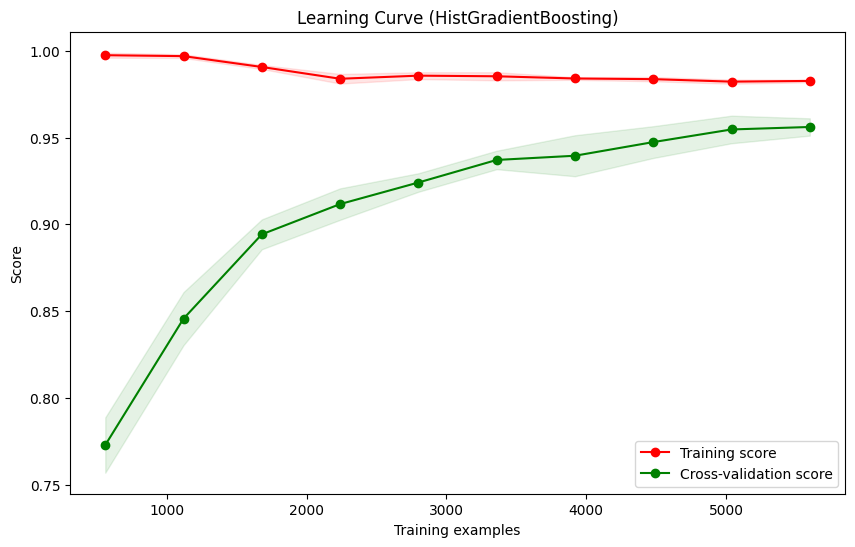

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Accuracy for each fold: [0.9928571428571429, 0.9957142857142857, 0.9871428571428571, 0.9928571428571429, 0.9842857142857143, 0.9814285714285714, 0.9914285714285714, 0.9842857142857143, 0.9871428571428571, 0.9871244635193133]
Mean accuracy: 0.988426732066217
95% confidence interval: (0.9851430140895155, 0.9917104500429185)


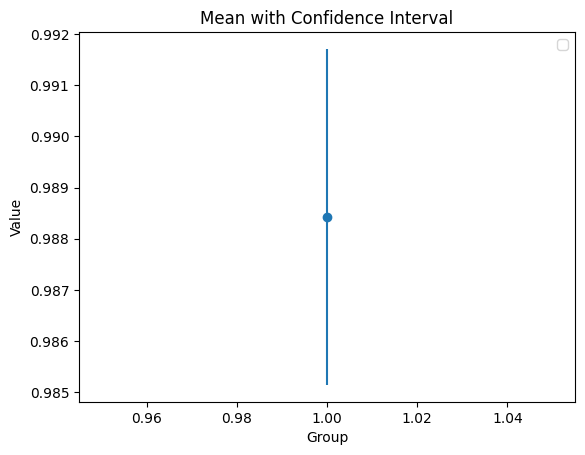

In [3]:
print('ADDING 50% TO FEATURE: AGE')
print('--------------------------------------')
indices, original_values = null_utility.add_null_values(df,'age', 50)
print('\n DECISION TREE PREDICTIONS AND RESULTS')
print('---------------------------------------------------')
decision_tree = ML_algorithms.train_decision_tree_model(df, df_to_test)
ML_algorithms.k_fold_cross_validation_dt(decision_tree,df)
    
print('\n PRINT HGB PREDICTIONS AND RESULTS')
print('---------------------------------------------------')
hgb = ML_algorithms.train_hist_gradient_boosting_model(df, df_to_test)
ML_algorithms.k_fold_cross_validation_dt(hgb,df) 
    
df.loc[indices, 'age'] = original_values

adding 50% null values to hypertension feature

ADDING 50% TO FEATURE: HYPERTENSION
--------------------------------------

 DECISION TREE PREDICTIONS AND RESULTS
---------------------------------------------------
Classification Report on Training Set:
              precision    recall  f1-score   support

           0       1.00      0.97      0.98      3451
           1       0.97      1.00      0.98      3548

    accuracy                           0.98      6999
   macro avg       0.98      0.98      0.98      6999
weighted avg       0.98      0.98      0.98      6999

Classification Report on Test Set - dirty:
              precision    recall  f1-score   support

           0       0.99      0.94      0.97      1548
           1       0.94      0.99      0.96      1452

    accuracy                           0.96      3000
   macro avg       0.97      0.97      0.96      3000
weighted avg       0.97      0.96      0.97      3000

Classification Report on Test Set - original:
              precision    recall  f1-score   suppo

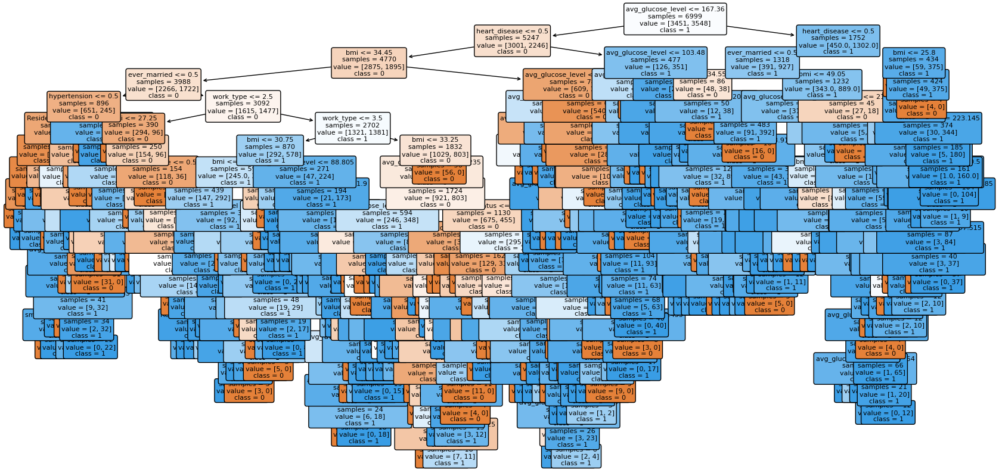

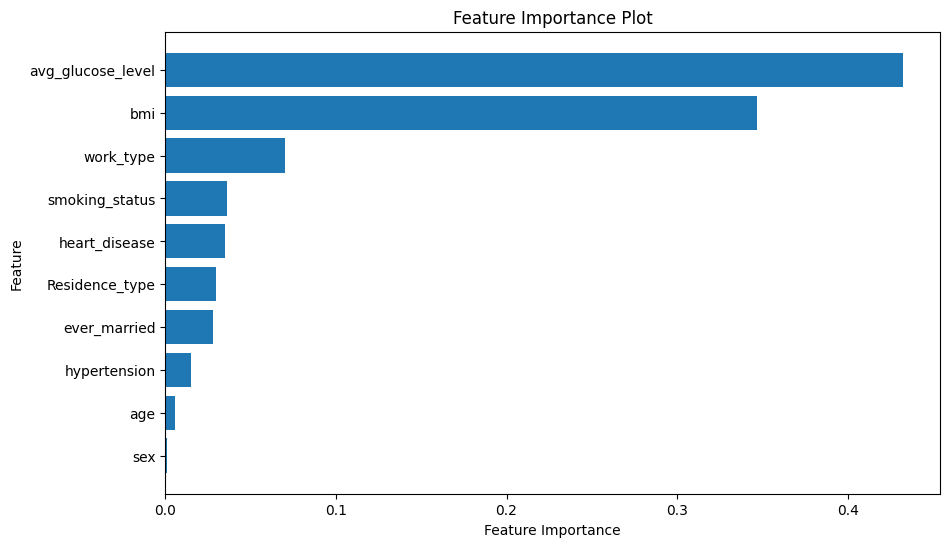

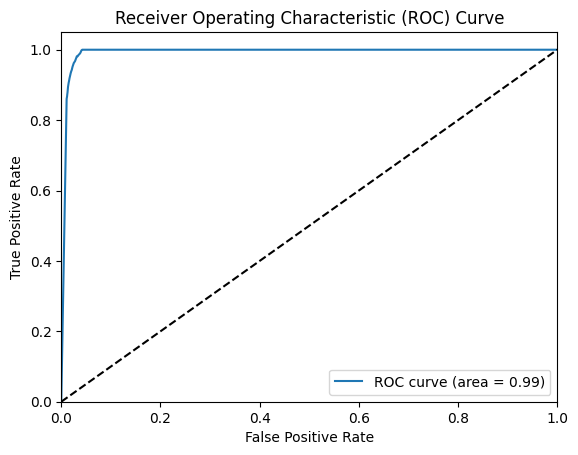

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


AUC Score: 0.9924150030006
Accuracy for each fold: [0.9428571428571428, 0.9485714285714286, 0.9714285714285714, 0.9485714285714286, 0.9557142857142857, 0.9471428571428572, 0.9728571428571429, 0.9485714285714286, 0.9557142857142857, 0.9570815450643777]
Mean accuracy: 0.9548510116492951
95% confidence interval: (0.9475906577224673, 0.9621113655761229)


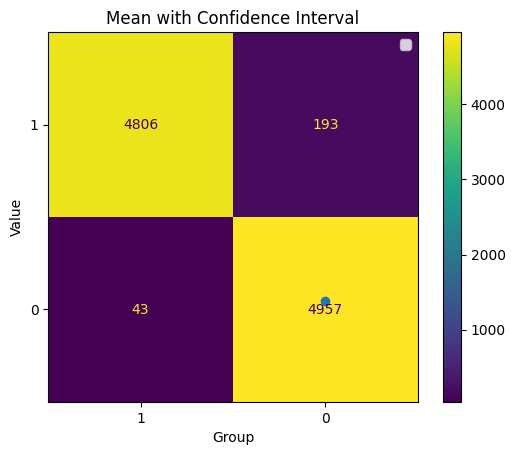


 PRINT HGB PREDICTIONS AND RESULTS
---------------------------------------------------
Fitting 5 folds for each of 50 candidates, totalling 250 fits
search time: 31.04851269721985
Best parameters found:  {'l2_regularization': 0.3, 'learning_rate': 0.2, 'max_depth': 6, 'max_iter': 478, 'min_samples_leaf': 15}
Best score on training data:  1.0
Classification Report on Training Set - dirty:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3451
           1       1.00      1.00      1.00      3548

    accuracy                           1.00      6999
   macro avg       1.00      1.00      1.00      6999
weighted avg       1.00      1.00      1.00      6999

Classification Report on Test Set - dirty:
              precision    recall  f1-score   support

           0       1.00      0.98      0.99      1548
           1       0.98      1.00      0.99      1452

    accuracy                           0.99      3000
   macro avg       0

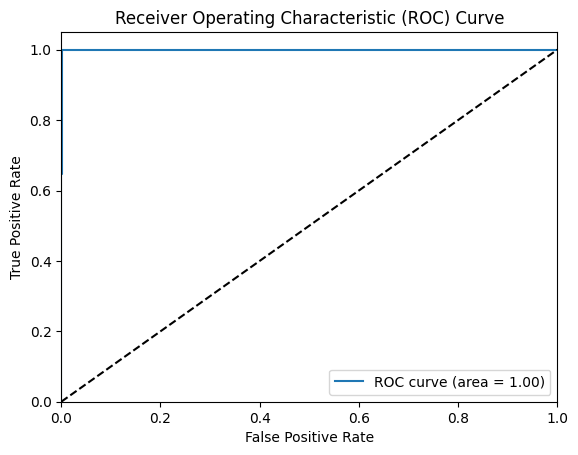

AUC Score: 0.9995622724544908


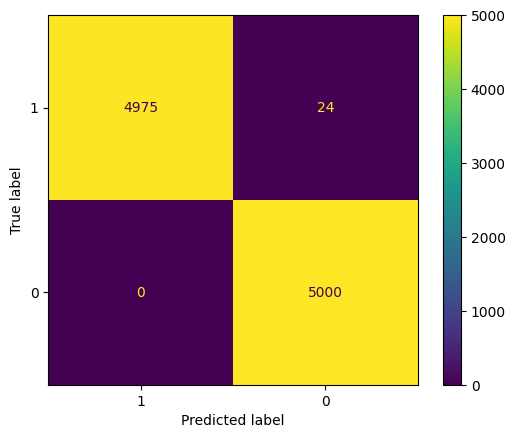

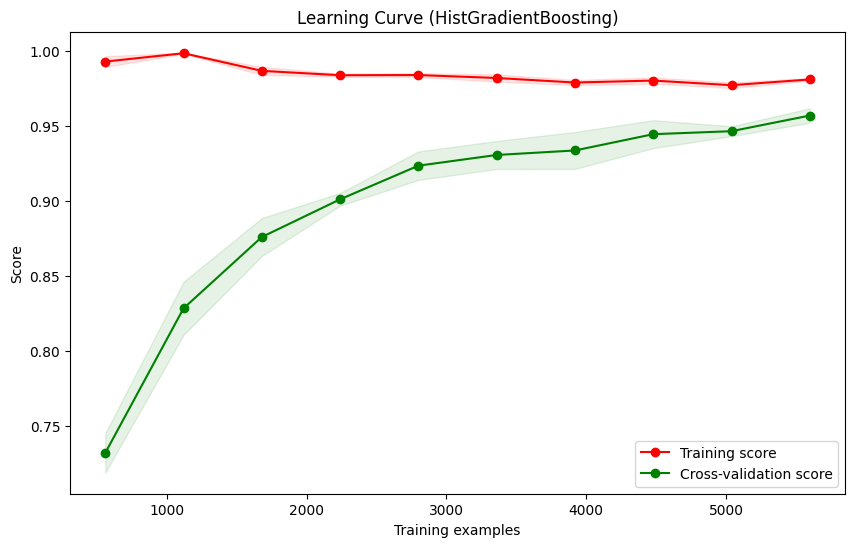

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Accuracy for each fold: [0.9857142857142858, 0.99, 0.9871428571428571, 0.9885714285714285, 0.9857142857142858, 0.9885714285714285, 0.9842857142857143, 0.9957142857142857, 0.9857142857142858, 0.9785407725321889]
Mean accuracy: 0.9869969343960759
95% confidence interval: (0.9838534951505192, 0.9901403736416327)


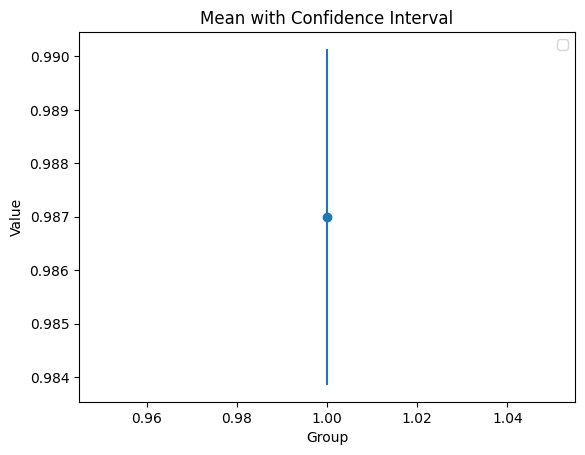

In [4]:
print('ADDING 50% TO FEATURE: HYPERTENSION')
print('--------------------------------------')
indices, original_values = null_utility.add_null_values(df,'hypertension', 50)
print('\n DECISION TREE PREDICTIONS AND RESULTS')
print('---------------------------------------------------')
decision_tree = ML_algorithms.train_decision_tree_model(df, df_to_test)
ML_algorithms.k_fold_cross_validation_dt(decision_tree,df)
    
print('\n PRINT HGB PREDICTIONS AND RESULTS')
print('---------------------------------------------------')
hgb = ML_algorithms.train_hist_gradient_boosting_model(df, df_to_test)
ML_algorithms.k_fold_cross_validation_dt(hgb,df) 
    
df.loc[indices, 'hypertension'] = original_values

adding 50% null values to heart_disease feature

ADDING 50% TO FEATURE: HEART_DISEASE
--------------------------------------

 DECISION TREE PREDICTIONS AND RESULTS
---------------------------------------------------
Classification Report on Training Set:
              precision    recall  f1-score   support

           0       1.00      0.97      0.98      3451
           1       0.97      1.00      0.98      3548

    accuracy                           0.98      6999
   macro avg       0.98      0.98      0.98      6999
weighted avg       0.98      0.98      0.98      6999

Classification Report on Test Set - dirty:
              precision    recall  f1-score   support

           0       0.99      0.93      0.96      1548
           1       0.93      0.99      0.96      1452

    accuracy                           0.96      3000
   macro avg       0.96      0.96      0.96      3000
weighted avg       0.96      0.96      0.96      3000

Classification Report on Test Set - original:
              precision    recall  f1-score   supp

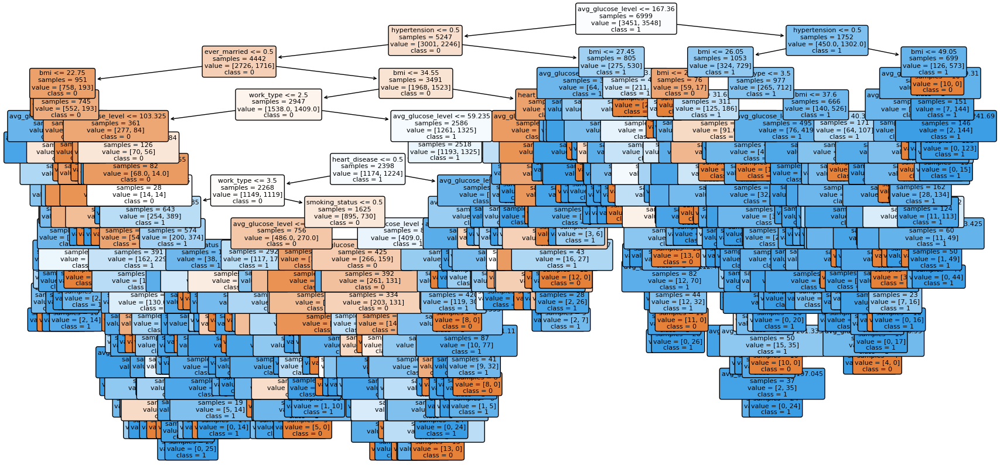

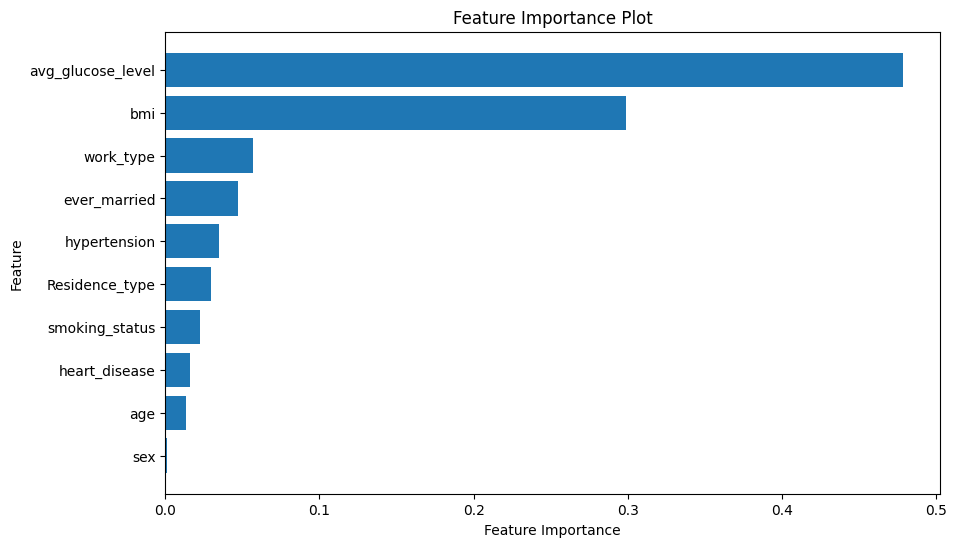

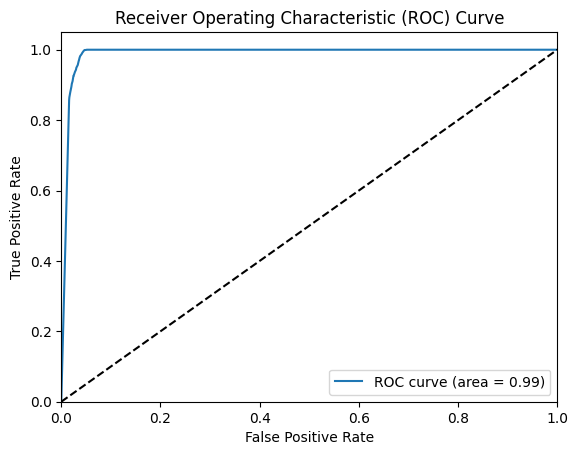

AUC Score: 0.989297299459892


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Accuracy for each fold: [0.9342857142857143, 0.9471428571428572, 0.9385714285714286, 0.9271428571428572, 0.9442857142857143, 0.9614285714285714, 0.9414285714285714, 0.95, 0.9428571428571428, 0.9542203147353362]
Mean accuracy: 0.9441363171878192
95% confidence interval: (0.9371033822479159, 0.9511692521277225)


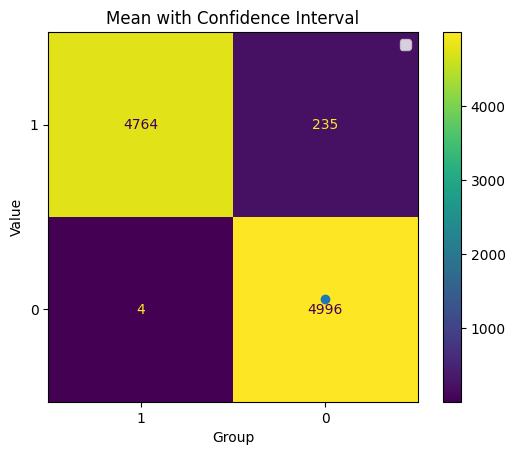


 PRINT HGB PREDICTIONS AND RESULTS
---------------------------------------------------
Fitting 5 folds for each of 50 candidates, totalling 250 fits
search time: 31.001340627670288
Best parameters found:  {'l2_regularization': 0.1, 'learning_rate': 0.3, 'max_depth': 8, 'max_iter': 143, 'min_samples_leaf': 5}
Best score on training data:  1.0
Classification Report on Training Set - dirty:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3451
           1       1.00      1.00      1.00      3548

    accuracy                           1.00      6999
   macro avg       1.00      1.00      1.00      6999
weighted avg       1.00      1.00      1.00      6999

Classification Report on Test Set - dirty:
              precision    recall  f1-score   support

           0       1.00      0.98      0.99      1548
           1       0.98      1.00      0.99      1452

    accuracy                           0.99      3000
   macro avg       0

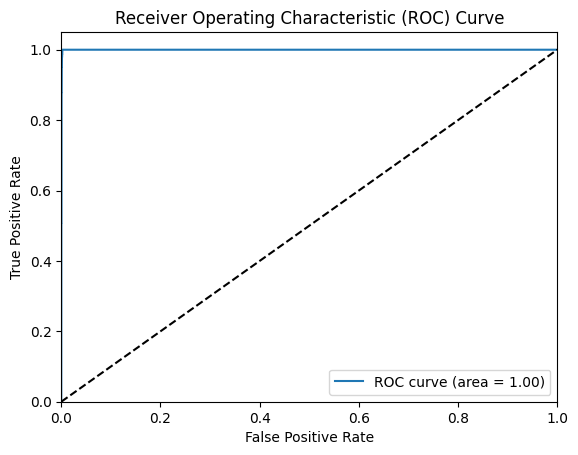

AUC Score: 0.9996487297459491


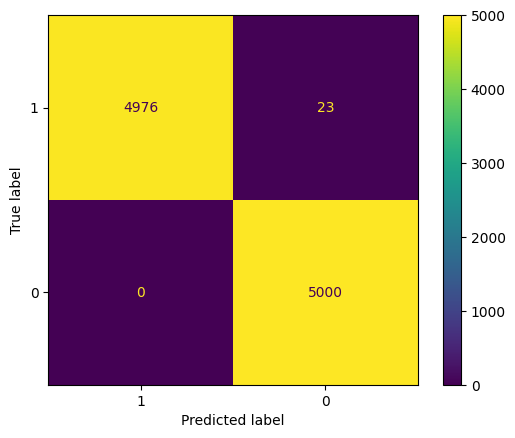

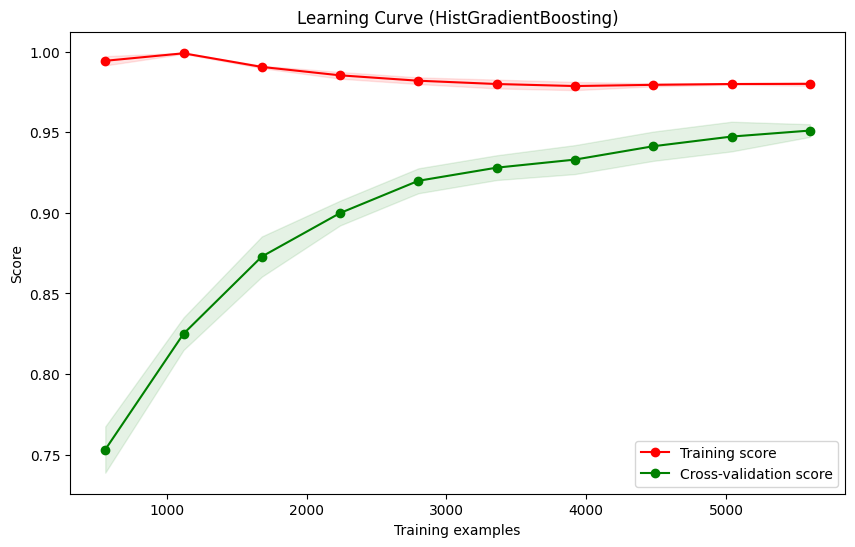

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Accuracy for each fold: [0.9857142857142858, 0.9885714285714285, 0.9857142857142858, 0.9885714285714285, 0.9871428571428571, 0.9757142857142858, 0.9914285714285714, 0.9914285714285714, 0.9842857142857143, 0.9914163090128756]
Mean accuracy: 0.9869987737584303
95% confidence interval: (0.9836120101013833, 0.9903855374154772)


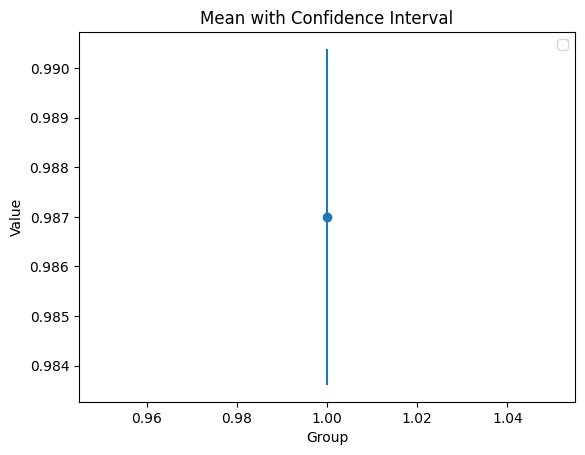

In [5]:
print('ADDING 50% TO FEATURE: HEART_DISEASE')
print('--------------------------------------')
indices, original_values = null_utility.add_null_values(df,'heart_disease', 50)
print('\n DECISION TREE PREDICTIONS AND RESULTS')
print('---------------------------------------------------')
decision_tree = ML_algorithms.train_decision_tree_model(df, df_to_test)
ML_algorithms.k_fold_cross_validation_dt(decision_tree,df)
    
print('\n PRINT HGB PREDICTIONS AND RESULTS')
print('---------------------------------------------------')
hgb = ML_algorithms.train_hist_gradient_boosting_model(df, df_to_test)
ML_algorithms.k_fold_cross_validation_dt(hgb,df) 
    
df.loc[indices, 'heart_disease'] = original_values

adding 50% null values to ever_married feature

ADDING 50% TO FEATURE: EVER_MARRIED
--------------------------------------

 DECISION TREE PREDICTIONS AND RESULTS
---------------------------------------------------
Classification Report on Training Set:
              precision    recall  f1-score   support

           0       1.00      0.96      0.98      3451
           1       0.96      1.00      0.98      3548

    accuracy                           0.98      6999
   macro avg       0.98      0.98      0.98      6999
weighted avg       0.98      0.98      0.98      6999

Classification Report on Test Set - dirty:
              precision    recall  f1-score   support

           0       1.00      0.92      0.96      1548
           1       0.92      1.00      0.96      1452

    accuracy                           0.96      3000
   macro avg       0.96      0.96      0.96      3000
weighted avg       0.96      0.96      0.96      3000

Classification Report on Test Set - original:
              precision    recall  f1-score   suppo

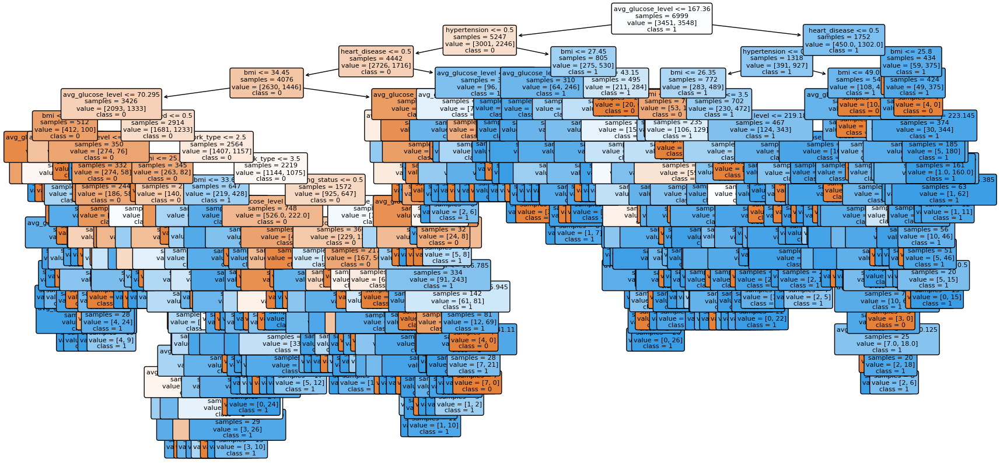

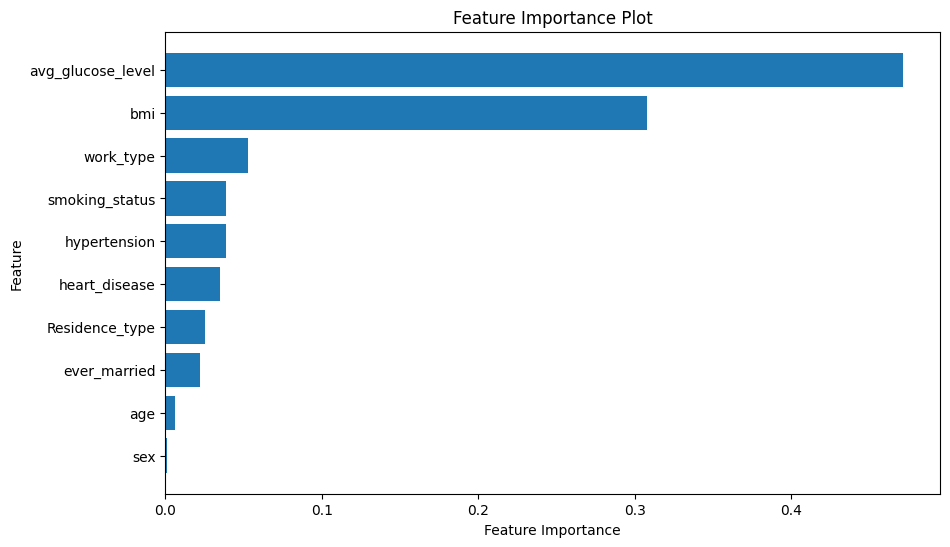

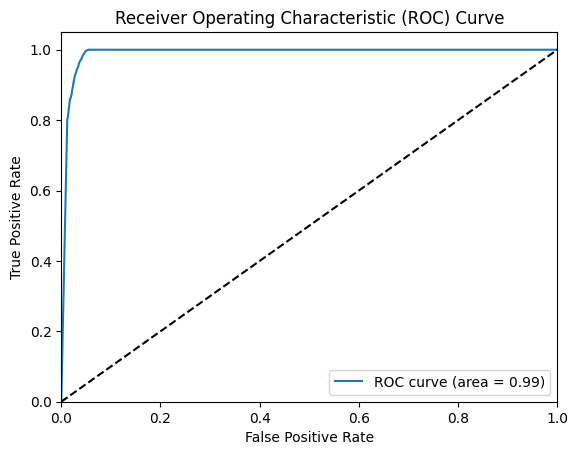

AUC Score: 0.9899977595519104


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Accuracy for each fold: [0.9628571428571429, 0.9342857142857143, 0.9542857142857143, 0.9514285714285714, 0.9528571428571428, 0.9657142857142857, 0.9585714285714285, 0.9571428571428572, 0.9514285714285714, 0.9513590844062947]
Mean accuracy: 0.9539930512977725
95% confidence interval: (0.947882489532608, 0.9601036130629369)


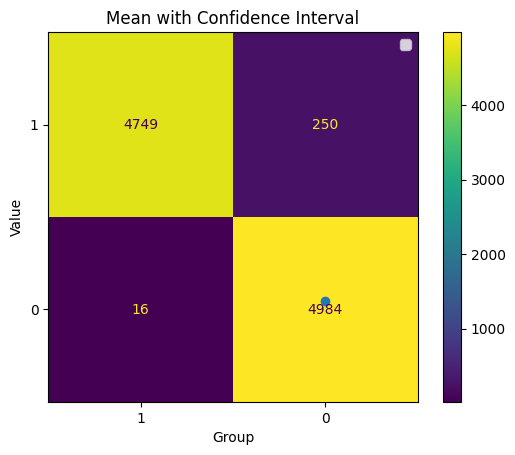


 PRINT HGB PREDICTIONS AND RESULTS
---------------------------------------------------
Fitting 5 folds for each of 50 candidates, totalling 250 fits
search time: 33.20605731010437
Best parameters found:  {'l2_regularization': 0.3, 'learning_rate': 0.3, 'max_depth': 9, 'max_iter': 208, 'min_samples_leaf': 6}
Best score on training data:  1.0
Classification Report on Training Set - dirty:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3451
           1       1.00      1.00      1.00      3548

    accuracy                           1.00      6999
   macro avg       1.00      1.00      1.00      6999
weighted avg       1.00      1.00      1.00      6999

Classification Report on Test Set - dirty:
              precision    recall  f1-score   support

           0       1.00      0.98      0.99      1548
           1       0.98      1.00      0.99      1452

    accuracy                           0.99      3000
   macro avg       0.

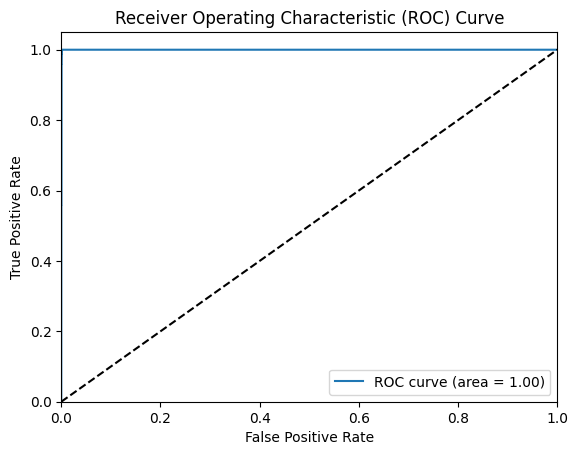

AUC Score: 0.9996850570114023


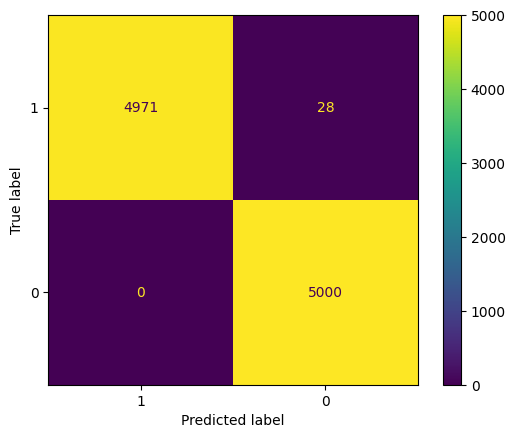

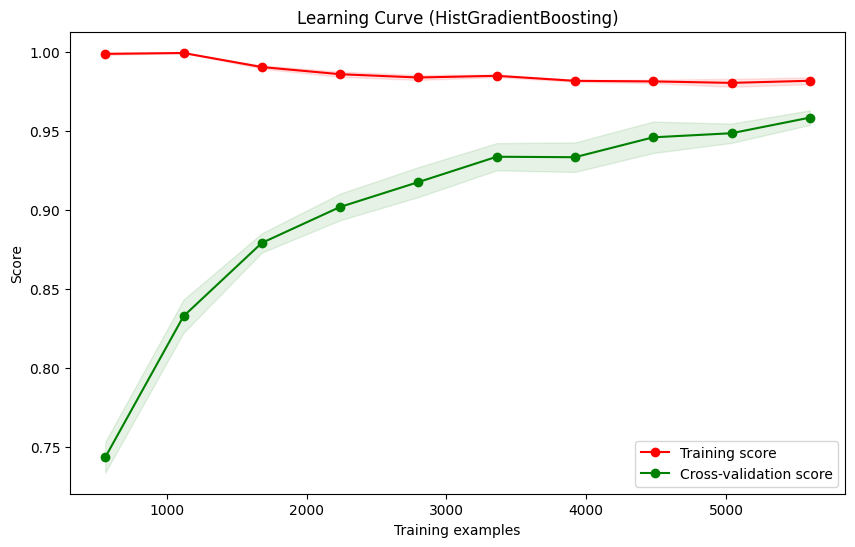

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Accuracy for each fold: [0.9885714285714285, 0.9914285714285714, 0.9842857142857143, 0.9857142857142858, 0.9928571428571429, 0.9828571428571429, 0.9871428571428571, 0.9785714285714285, 0.9928571428571429, 0.9842632331902719]
Mean accuracy: 0.9868548947475986
95% confidence interval: (0.9835232278457119, 0.9901865616494853)


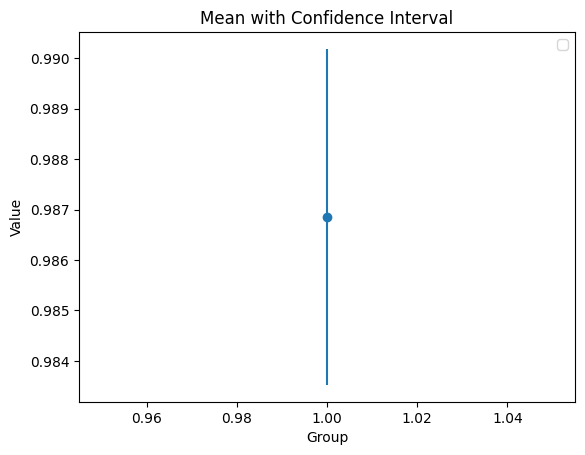

In [6]:
print('ADDING 50% TO FEATURE: EVER_MARRIED')
print('--------------------------------------')
indices, original_values = null_utility.add_null_values(df,'ever_married', 50)
print('\n DECISION TREE PREDICTIONS AND RESULTS')
print('---------------------------------------------------')
decision_tree = ML_algorithms.train_decision_tree_model(df, df_to_test)
ML_algorithms.k_fold_cross_validation_dt(decision_tree,df)
    
print('\n PRINT HGB PREDICTIONS AND RESULTS')
print('---------------------------------------------------')
hgb = ML_algorithms.train_hist_gradient_boosting_model(df, df_to_test)
ML_algorithms.k_fold_cross_validation_dt(hgb,df) 
    
df.loc[indices, 'ever_married'] = original_values

adding 50% null values to work_type feature

ADDING 100% TO FEATURE: WORK_TYPE
--------------------------------------

 DECISION TREE PREDICTIONS AND RESULTS
---------------------------------------------------
Classification Report on Training Set:
              precision    recall  f1-score   support

           0       1.00      0.97      0.98      3451
           1       0.97      1.00      0.99      3548

    accuracy                           0.98      6999
   macro avg       0.99      0.98      0.98      6999
weighted avg       0.99      0.98      0.98      6999

Classification Report on Test Set - dirty:
              precision    recall  f1-score   support

           0       1.00      0.94      0.97      1548
           1       0.94      1.00      0.97      1452

    accuracy                           0.97      3000
   macro avg       0.97      0.97      0.97      3000
weighted avg       0.97      0.97      0.97      3000

Classification Report on Test Set - original:
              precision    recall  f1-score   support

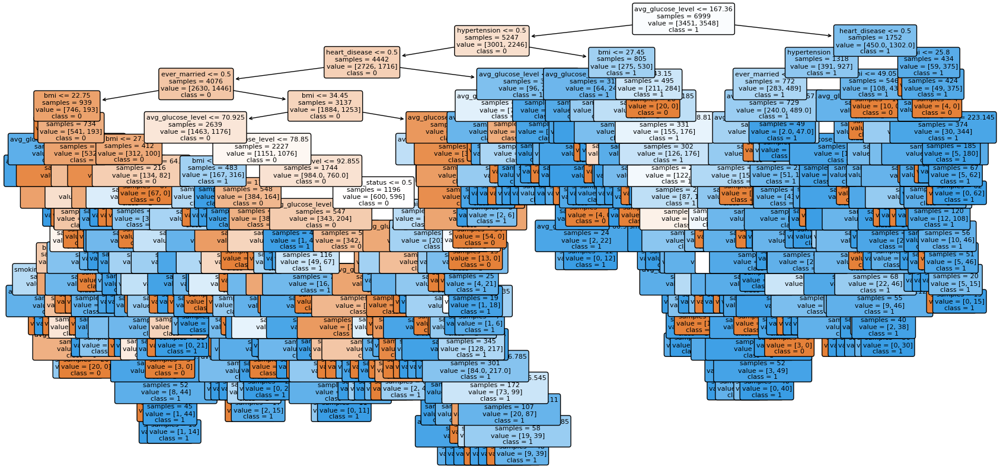

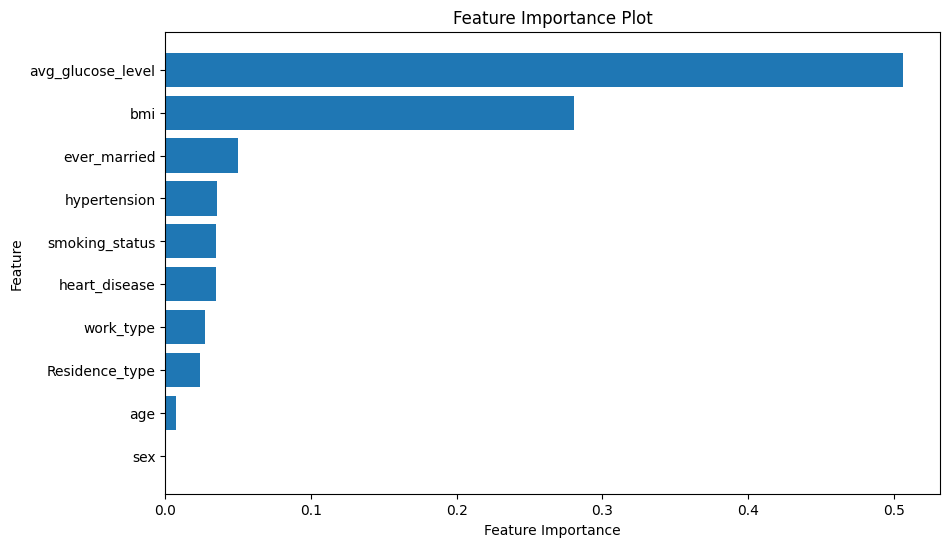

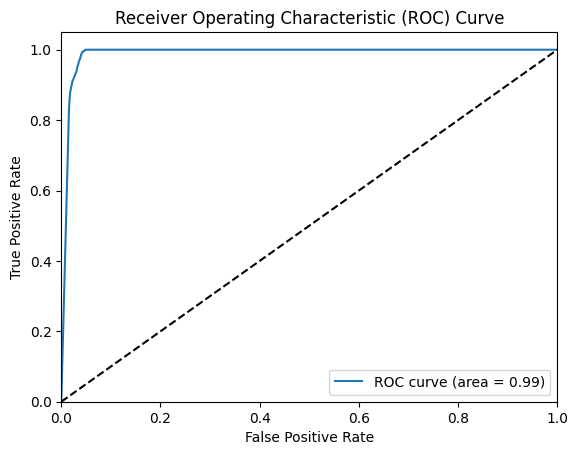

AUC Score: 0.9890954990998199


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Accuracy for each fold: [0.9771428571428571, 0.9471428571428572, 0.9614285714285714, 0.9814285714285714, 0.9671428571428572, 0.9671428571428572, 0.9485714285714286, 0.95, 0.9657142857142857, 0.9713876967095851]
Mean accuracy: 0.9637101982423871
95% confidence interval: (0.9551866100139343, 0.9722337864708399)


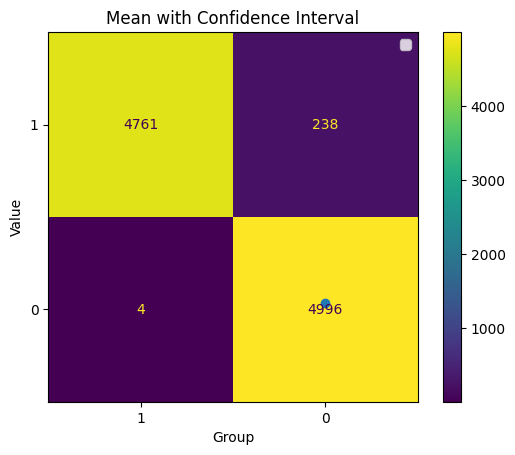


 PRINT HGB PREDICTIONS AND RESULTS
---------------------------------------------------
Fitting 5 folds for each of 50 candidates, totalling 250 fits
search time: 36.7663140296936
Best parameters found:  {'l2_regularization': 0.0, 'learning_rate': 0.3, 'max_depth': 9, 'max_iter': 323, 'min_samples_leaf': 11}
Best score on training data:  1.0
Classification Report on Training Set - dirty:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3451
           1       1.00      1.00      1.00      3548

    accuracy                           1.00      6999
   macro avg       1.00      1.00      1.00      6999
weighted avg       1.00      1.00      1.00      6999

Classification Report on Test Set - dirty:
              precision    recall  f1-score   support

           0       1.00      0.99      0.99      1548
           1       0.99      1.00      0.99      1452

    accuracy                           0.99      3000
   macro avg       0.

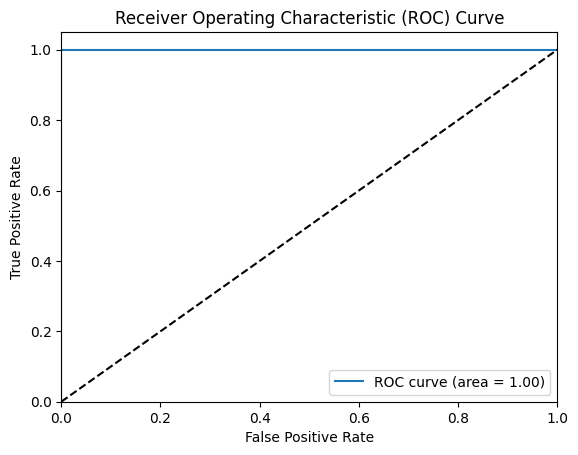

AUC Score: 0.9997457891578316


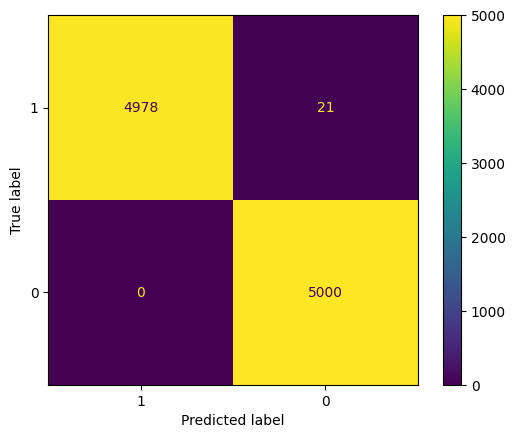

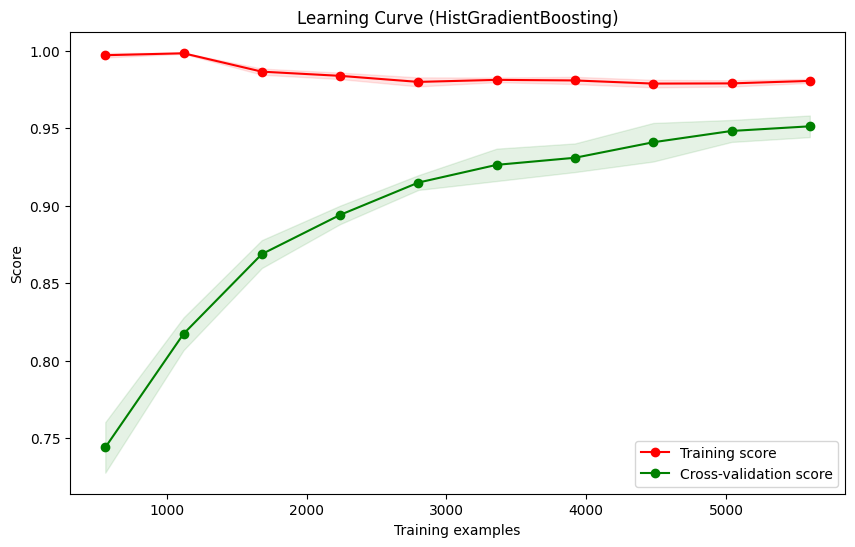

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Accuracy for each fold: [0.9942857142857143, 0.9842857142857143, 0.9828571428571429, 0.9857142857142858, 0.9871428571428571, 0.99, 0.9942857142857143, 0.9928571428571429, 0.9928571428571429, 0.9856938483547926]
Mean accuracy: 0.9889979562640507
95% confidence interval: (0.98587279952417, 0.9921231130039315)


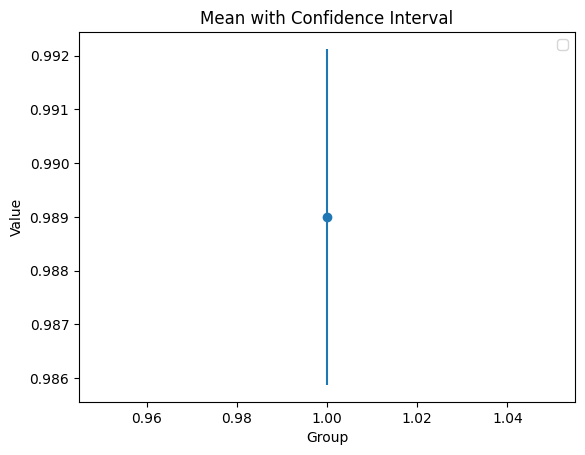

In [7]:
print('ADDING 100% TO FEATURE: WORK_TYPE')
print('--------------------------------------')
indices, original_values = null_utility.add_null_values(df,'work_type', 50)
print('\n DECISION TREE PREDICTIONS AND RESULTS')
print('---------------------------------------------------')
decision_tree = ML_algorithms.train_decision_tree_model(df, df_to_test)
ML_algorithms.k_fold_cross_validation_dt(decision_tree,df)
    
print('\n PRINT HGB PREDICTIONS AND RESULTS')
print('---------------------------------------------------')
hgb = ML_algorithms.train_hist_gradient_boosting_model(df, df_to_test)
ML_algorithms.k_fold_cross_validation_dt(hgb,df) 
    
df.loc[indices, 'work_type'] = original_values

adding 50% null values to residence_type feature

ADDING 50% TO FEATURE: RESIDENCE_TYPE
--------------------------------------

 DECISION TREE PREDICTIONS AND RESULTS
---------------------------------------------------
Classification Report on Training Set:
              precision    recall  f1-score   support

           0       0.99      0.97      0.98      3451
           1       0.97      0.99      0.98      3548

    accuracy                           0.98      6999
   macro avg       0.98      0.98      0.98      6999
weighted avg       0.98      0.98      0.98      6999

Classification Report on Test Set - dirty:
              precision    recall  f1-score   support

           0       0.99      0.95      0.97      1548
           1       0.94      0.99      0.97      1452

    accuracy                           0.97      3000
   macro avg       0.97      0.97      0.97      3000
weighted avg       0.97      0.97      0.97      3000

Classification Report on Test Set - original:
              precision    recall  f1-score   sup

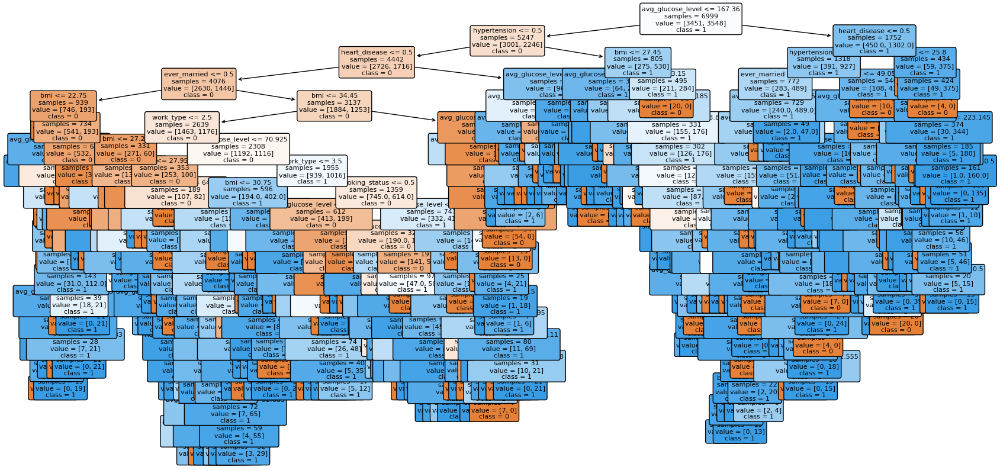

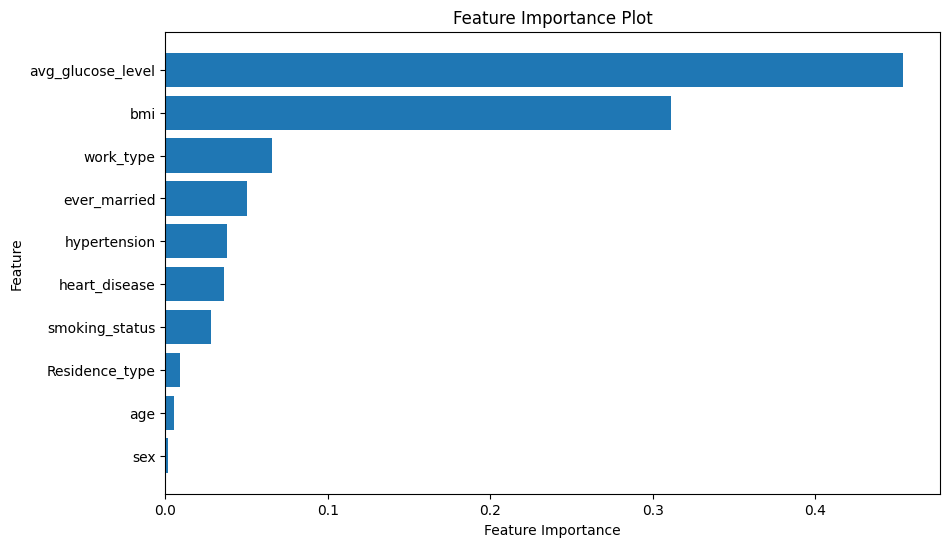

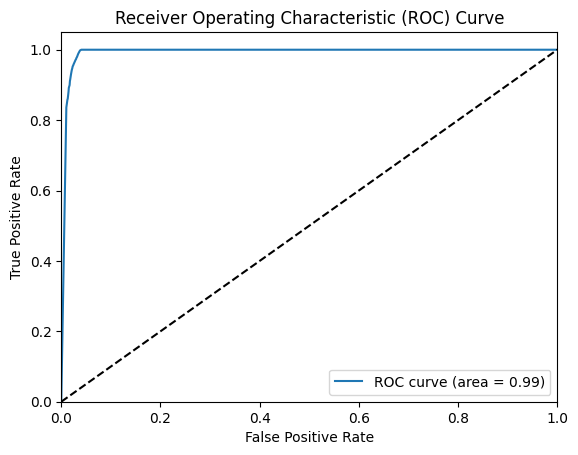

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


AUC Score: 0.9924117023404682
Accuracy for each fold: [0.9614285714285714, 0.9642857142857143, 0.9471428571428572, 0.9385714285714286, 0.9485714285714286, 0.9514285714285714, 0.9685714285714285, 0.9657142857142857, 0.9528571428571428, 0.9699570815450643]
Mean accuracy: 0.9568528510116494
95% confidence interval: (0.9492889107519684, 0.9644167912713304)


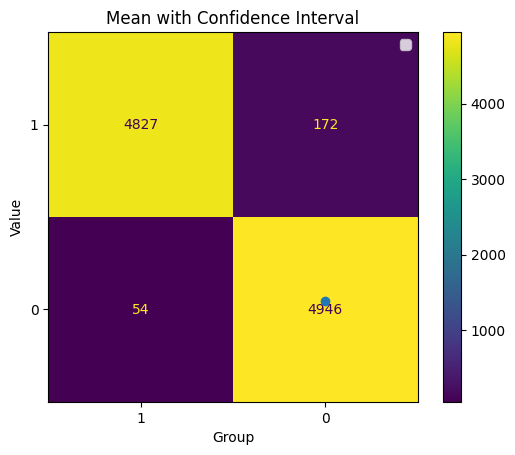


 PRINT HGB PREDICTIONS AND RESULTS
---------------------------------------------------
Fitting 5 folds for each of 50 candidates, totalling 250 fits
search time: 31.96521520614624
Best parameters found:  {'l2_regularization': 0.0, 'learning_rate': 0.3, 'max_depth': 7, 'max_iter': 277, 'min_samples_leaf': 6}
Best score on training data:  1.0
Classification Report on Training Set - dirty:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3451
           1       1.00      1.00      1.00      3548

    accuracy                           1.00      6999
   macro avg       1.00      1.00      1.00      6999
weighted avg       1.00      1.00      1.00      6999

Classification Report on Test Set - dirty:
              precision    recall  f1-score   support

           0       1.00      0.99      0.99      1548
           1       0.99      1.00      0.99      1452

    accuracy                           0.99      3000
   macro avg       0.

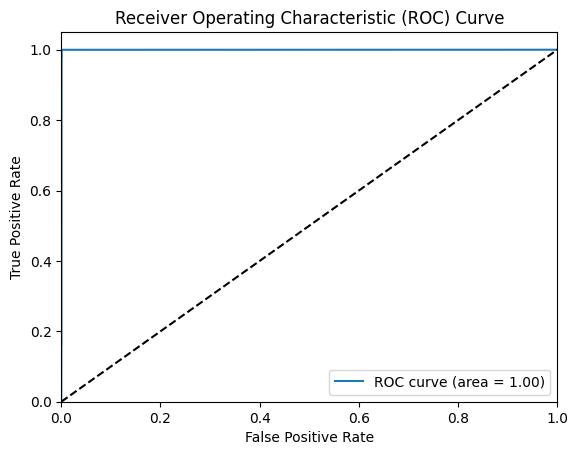

AUC Score: 0.9996248449689937


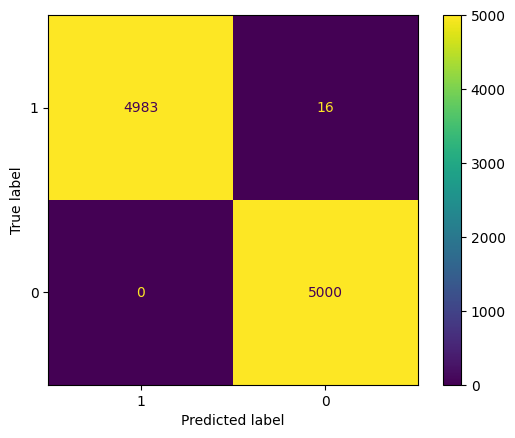

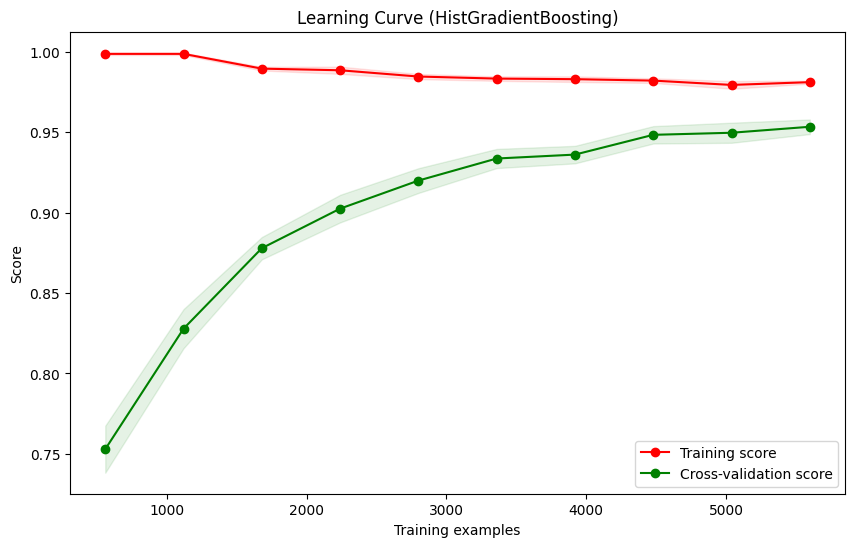

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Accuracy for each fold: [0.9828571428571429, 0.99, 0.9871428571428571, 0.9971428571428571, 0.99, 0.9842857142857143, 0.9914285714285714, 0.9857142857142858, 0.9885714285714285, 0.994277539341917]
Mean accuracy: 0.9891420396484776
95% confidence interval: (0.9859764337339435, 0.9923076455630117)


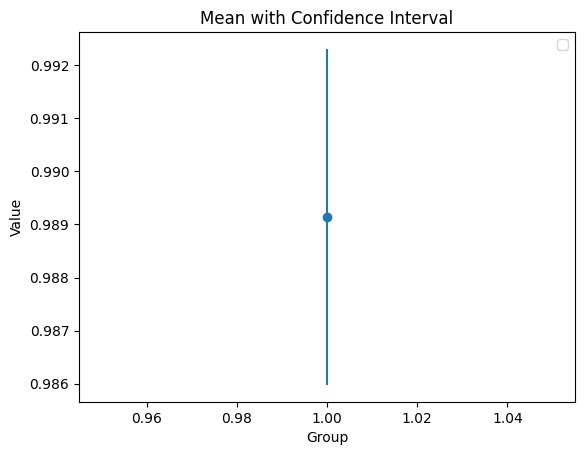

In [8]:
print('ADDING 50% TO FEATURE: RESIDENCE_TYPE')
print('--------------------------------------')
indices, original_values = null_utility.add_null_values(df,'Residence_type', 50)
print('\n DECISION TREE PREDICTIONS AND RESULTS')
print('---------------------------------------------------')
decision_tree = ML_algorithms.train_decision_tree_model(df, df_to_test)
ML_algorithms.k_fold_cross_validation_dt(decision_tree,df)
    
print('\n PRINT HGB PREDICTIONS AND RESULTS')
print('---------------------------------------------------')
hgb = ML_algorithms.train_hist_gradient_boosting_model(df, df_to_test)
ML_algorithms.k_fold_cross_validation_dt(hgb,df) 
    
df.loc[indices, 'Residence_type'] = original_values

adding 50% null values to avg_glucose_level feature

ADDING 50% TO FEATURE: AVG_GLUCOSE_LEVEL
--------------------------------------

 DECISION TREE PREDICTIONS AND RESULTS
---------------------------------------------------
Classification Report on Training Set:
              precision    recall  f1-score   support

           0       0.96      0.90      0.93      3451
           1       0.91      0.97      0.94      3548

    accuracy                           0.93      6999
   macro avg       0.94      0.93      0.93      6999
weighted avg       0.94      0.93      0.93      6999

Classification Report on Test Set - dirty:
              precision    recall  f1-score   support

           0       0.92      0.83      0.87      1548
           1       0.83      0.92      0.88      1452

    accuracy                           0.87      3000
   macro avg       0.88      0.87      0.87      3000
weighted avg       0.88      0.87      0.87      3000

Classification Report on Test Set - original:
              precision    recall  f1-score   

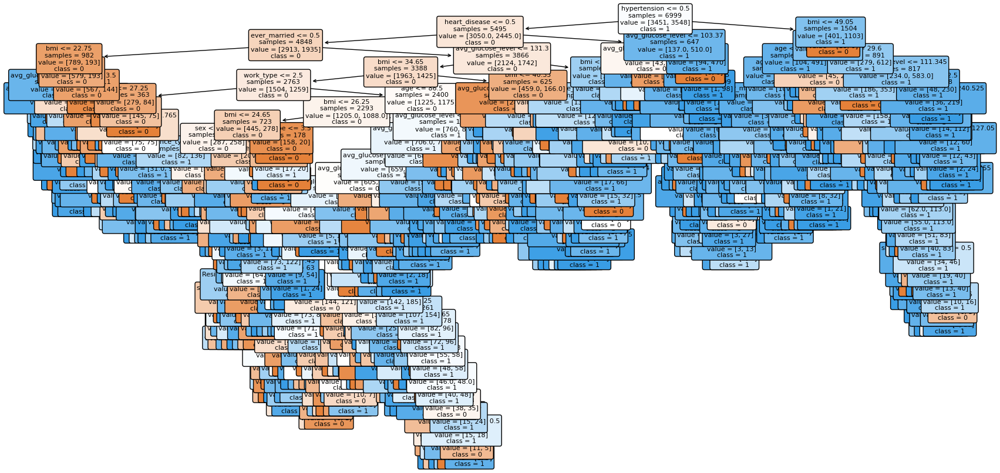

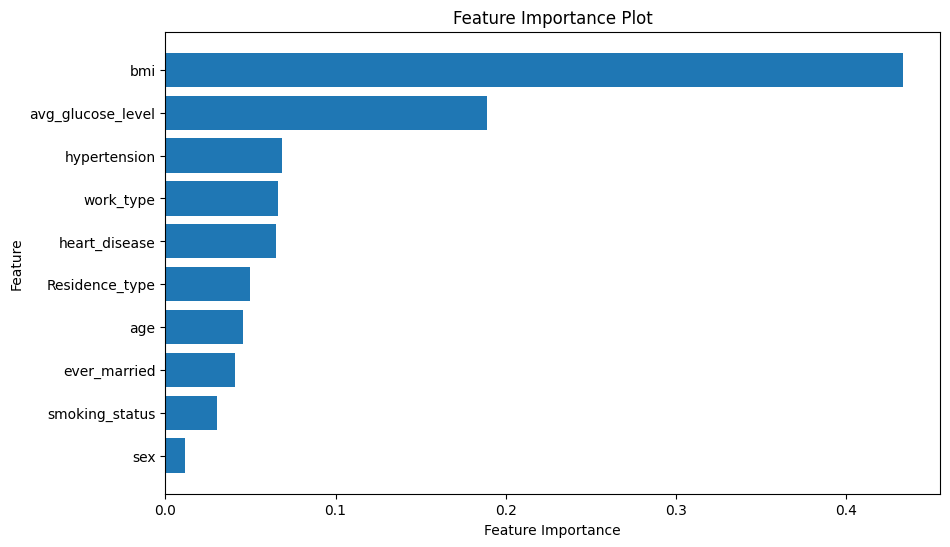

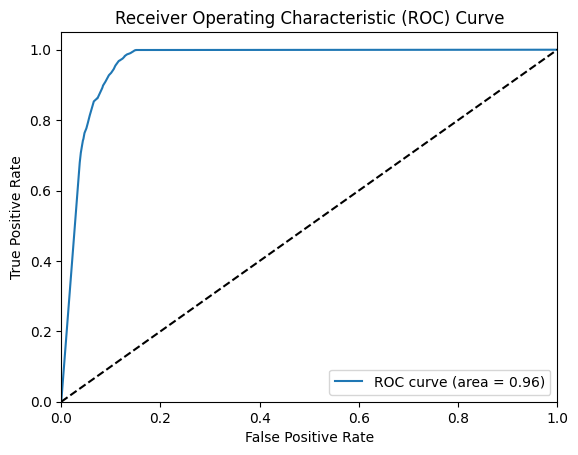

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


AUC Score: 0.9638138827765554
Accuracy for each fold: [0.7971428571428572, 0.86, 0.8814285714285715, 0.8671428571428571, 0.8742857142857143, 0.8842857142857142, 0.8614285714285714, 0.8728571428571429, 0.8785714285714286, 0.8884120171673819]
Mean accuracy: 0.8665554874310238
95% confidence interval: (0.847863434442409, 0.8852475404196387)


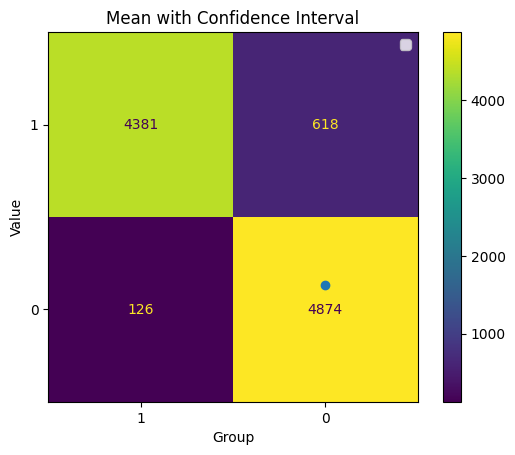


 PRINT HGB PREDICTIONS AND RESULTS
---------------------------------------------------
Fitting 5 folds for each of 50 candidates, totalling 250 fits
search time: 35.37495684623718
Best parameters found:  {'l2_regularization': 0.0, 'learning_rate': 0.1, 'max_depth': 9, 'max_iter': 492, 'min_samples_leaf': 1}
Best score on training data:  0.979143805002086
Classification Report on Training Set - dirty:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3451
           1       1.00      1.00      1.00      3548

    accuracy                           1.00      6999
   macro avg       1.00      1.00      1.00      6999
weighted avg       1.00      1.00      1.00      6999

Classification Report on Test Set - dirty:
              precision    recall  f1-score   support

           0       0.97      0.93      0.95      1548
           1       0.93      0.97      0.95      1452

    accuracy                           0.95      3000
   macr

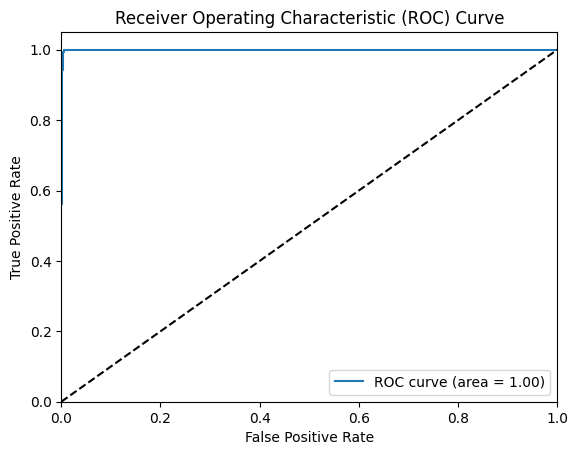

AUC Score: 0.9992079215843168


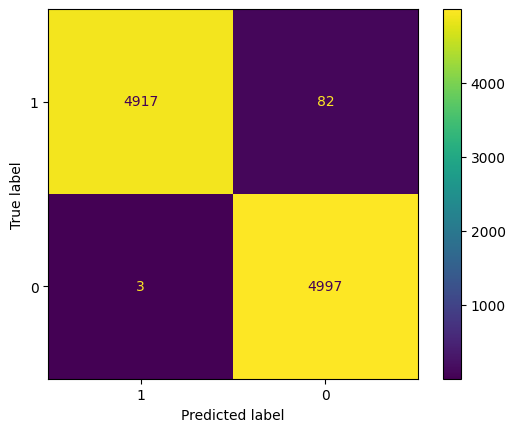

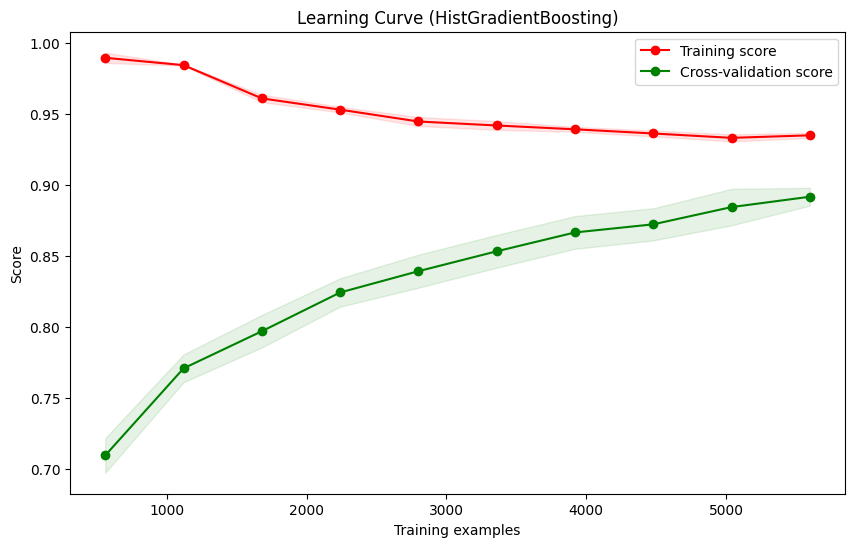

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Accuracy for each fold: [0.9457142857142857, 0.9442857142857143, 0.9485714285714286, 0.9585714285714285, 0.9357142857142857, 0.9471428571428572, 0.9528571428571428, 0.96, 0.9628571428571429, 0.9542203147353362]
Mean accuracy: 0.9509934600449622
95% confidence interval: (0.9450551535022147, 0.9569317665877097)


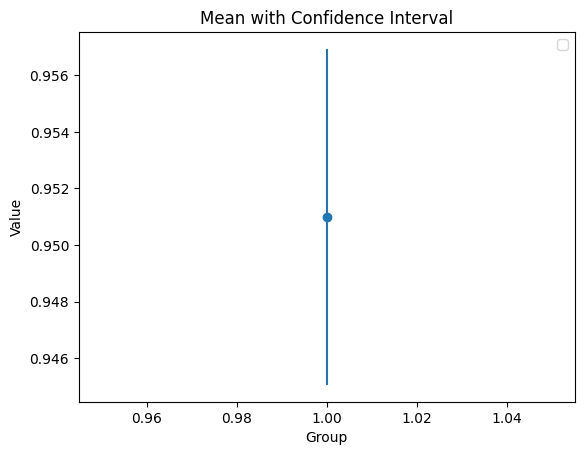

In [9]:
print('ADDING 50% TO FEATURE: AVG_GLUCOSE_LEVEL')
print('--------------------------------------')
indices, original_values = null_utility.add_null_values(df,'avg_glucose_level', 50)
print('\n DECISION TREE PREDICTIONS AND RESULTS')
print('---------------------------------------------------')
decision_tree = ML_algorithms.train_decision_tree_model(df, df_to_test)
ML_algorithms.k_fold_cross_validation_dt(decision_tree,df)
    
print('\n PRINT HGB PREDICTIONS AND RESULTS')
print('---------------------------------------------------')
hgb = ML_algorithms.train_hist_gradient_boosting_model(df, df_to_test)
ML_algorithms.k_fold_cross_validation_dt(hgb,df) 
    
df.loc[indices, 'avg_glucose_level'] = original_values

adding 50% null values to bmi feature

ADDING 50% TO FEATURE: BMI
--------------------------------------

 DECISION TREE PREDICTIONS AND RESULTS
---------------------------------------------------
Classification Report on Training Set:
              precision    recall  f1-score   support

           0       0.99      0.95      0.97      3451
           1       0.96      0.99      0.97      3548

    accuracy                           0.97      6999
   macro avg       0.97      0.97      0.97      6999
weighted avg       0.97      0.97      0.97      6999

Classification Report on Test Set - dirty:
              precision    recall  f1-score   support

           0       0.98      0.92      0.95      1548
           1       0.92      0.98      0.95      1452

    accuracy                           0.95      3000
   macro avg       0.95      0.95      0.95      3000
weighted avg       0.95      0.95      0.95      3000

Classification Report on Test Set - original:
              precision    recall  f1-score   support

     

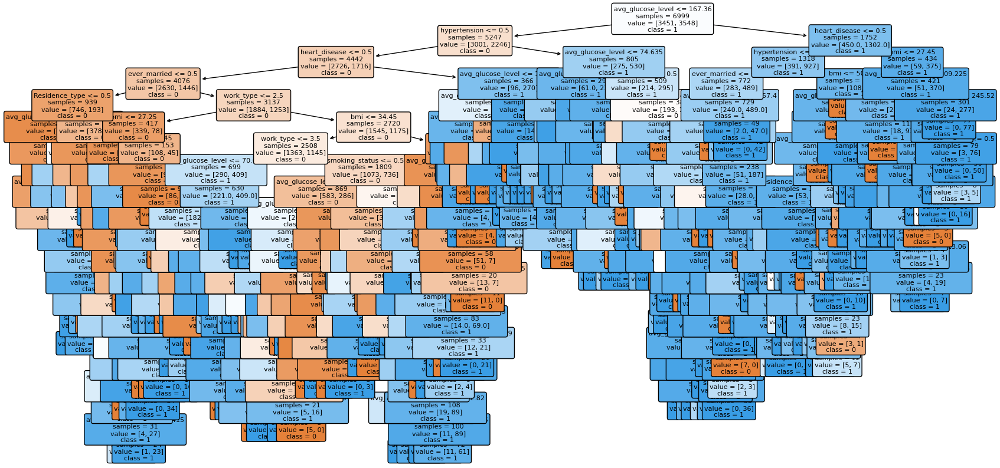

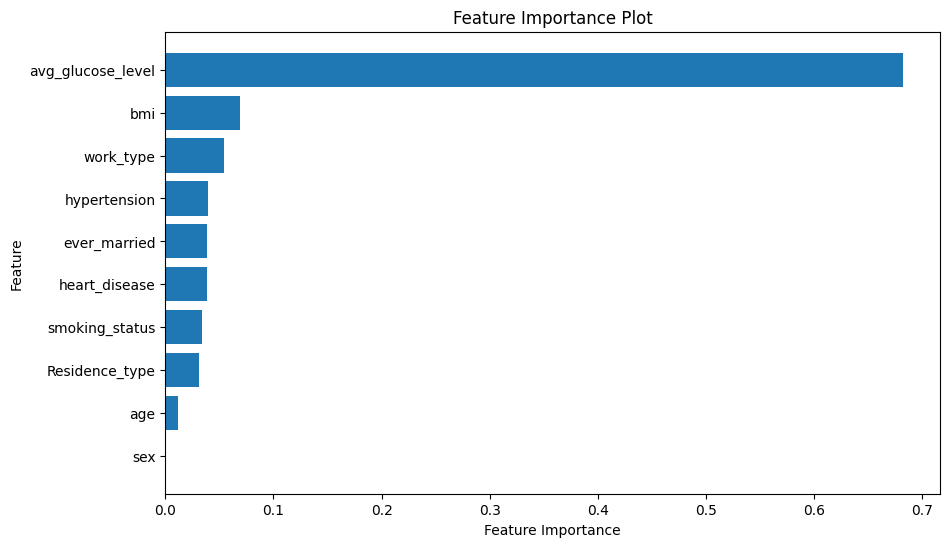

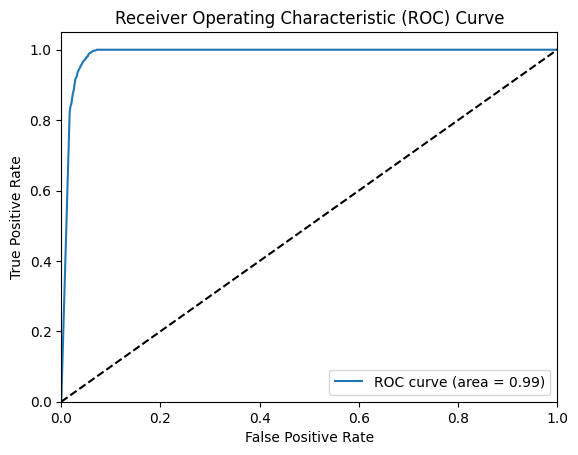

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


AUC Score: 0.9872978195639128
Accuracy for each fold: [0.9357142857142857, 0.9385714285714286, 0.9357142857142857, 0.9142857142857143, 0.92, 0.9157142857142857, 0.9428571428571428, 0.94, 0.9328571428571428, 0.927038626609442]
Mean accuracy: 0.9302752912323727
95% confidence interval: (0.9228438488779611, 0.9377067335867844)


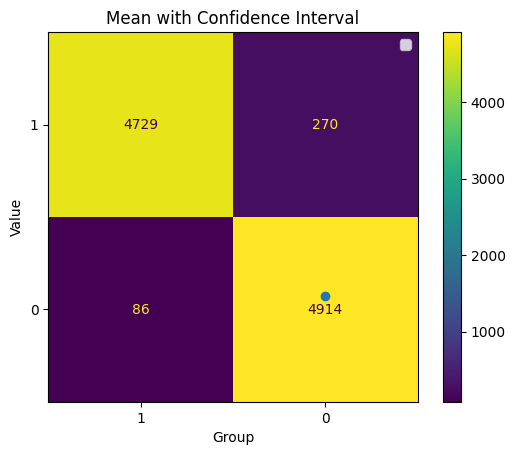


 PRINT HGB PREDICTIONS AND RESULTS
---------------------------------------------------
Fitting 5 folds for each of 50 candidates, totalling 250 fits
search time: 38.4094123840332
Best parameters found:  {'l2_regularization': 0.3, 'learning_rate': 0.3, 'max_depth': 9, 'max_iter': 119, 'min_samples_leaf': 8}
Best score on training data:  0.9890073303005622
Classification Report on Training Set - dirty:
              precision    recall  f1-score   support

           0       1.00      0.99      0.99      3451
           1       0.99      1.00      0.99      3548

    accuracy                           0.99      6999
   macro avg       0.99      0.99      0.99      6999
weighted avg       0.99      0.99      0.99      6999

Classification Report on Test Set - dirty:
              precision    recall  f1-score   support

           0       0.99      0.93      0.96      1548
           1       0.93      0.99      0.96      1452

    accuracy                           0.96      3000
   macr

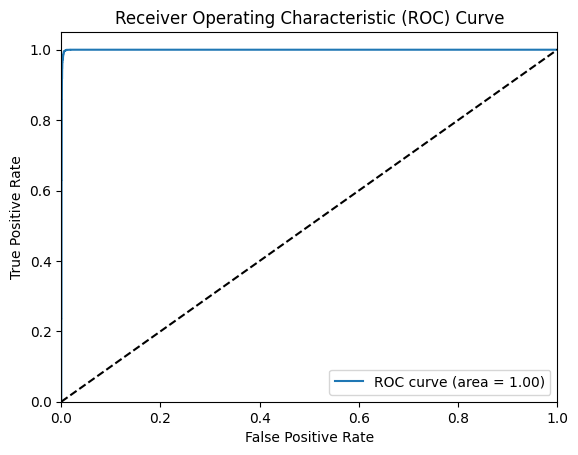

AUC Score: 0.9991999599919983


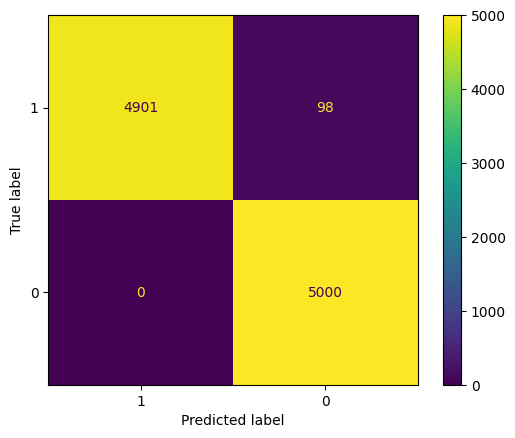

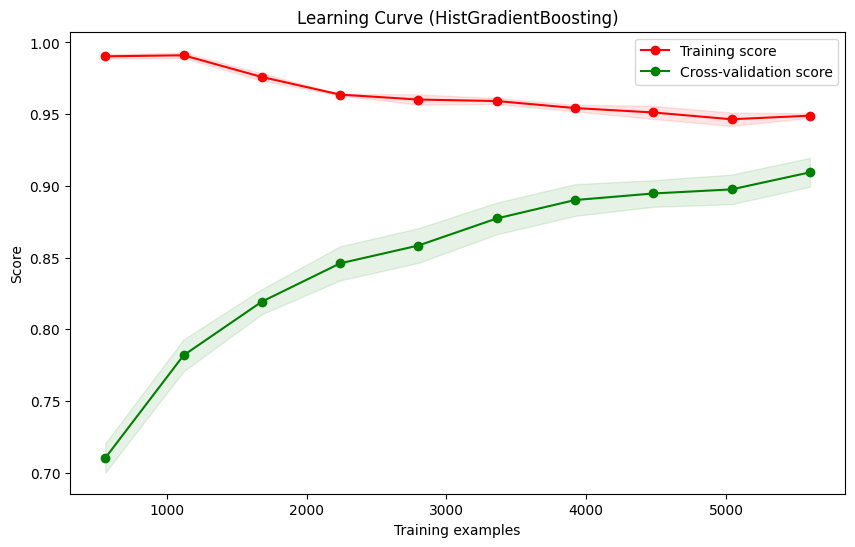

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Accuracy for each fold: [0.95, 0.9614285714285714, 0.9542857142857143, 0.9385714285714286, 0.9457142857142857, 0.9557142857142857, 0.9685714285714285, 0.96, 0.9471428571428572, 0.9527896995708155]
Mean accuracy: 0.9534218270999386
95% confidence interval: (0.9472295606183615, 0.9596140935815157)


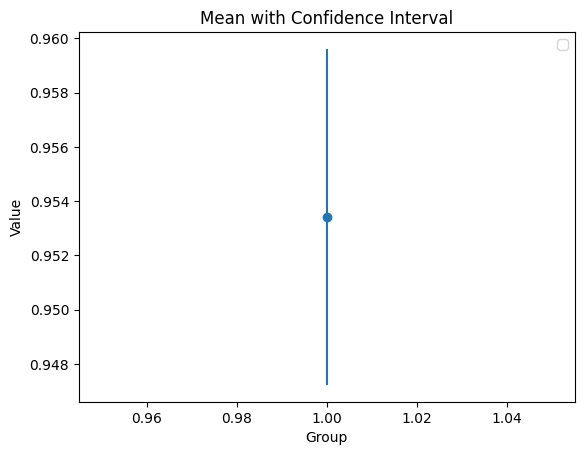

In [10]:
print('ADDING 50% TO FEATURE: BMI')
print('--------------------------------------')
indices, original_values = null_utility.add_null_values(df,'bmi', 50)
print('\n DECISION TREE PREDICTIONS AND RESULTS')
print('---------------------------------------------------')
decision_tree = ML_algorithms.train_decision_tree_model(df, df_to_test)
ML_algorithms.k_fold_cross_validation_dt(decision_tree,df)
    
print('\n PRINT HGB PREDICTIONS AND RESULTS')
print('---------------------------------------------------')
hgb = ML_algorithms.train_hist_gradient_boosting_model(df, df_to_test)
ML_algorithms.k_fold_cross_validation_dt(hgb,df) 
    
df.loc[indices, 'bmi'] = original_values

adding 50% null values to smoking_status feature

ADDING 50% TO FEATURE: SMOKING_STATUS
--------------------------------------

 DECISION TREE PREDICTIONS AND RESULTS
---------------------------------------------------
Classification Report on Training Set:
              precision    recall  f1-score   support

           0       0.97      0.96      0.97      3451
           1       0.96      0.98      0.97      3548

    accuracy                           0.97      6999
   macro avg       0.97      0.97      0.97      6999
weighted avg       0.97      0.97      0.97      6999

Classification Report on Test Set - dirty:
              precision    recall  f1-score   support

           0       0.97      0.92      0.95      1548
           1       0.92      0.97      0.94      1452

    accuracy                           0.94      3000
   macro avg       0.95      0.95      0.94      3000
weighted avg       0.95      0.94      0.95      3000

Classification Report on Test Set - original:
              precision    recall  f1-score   sup

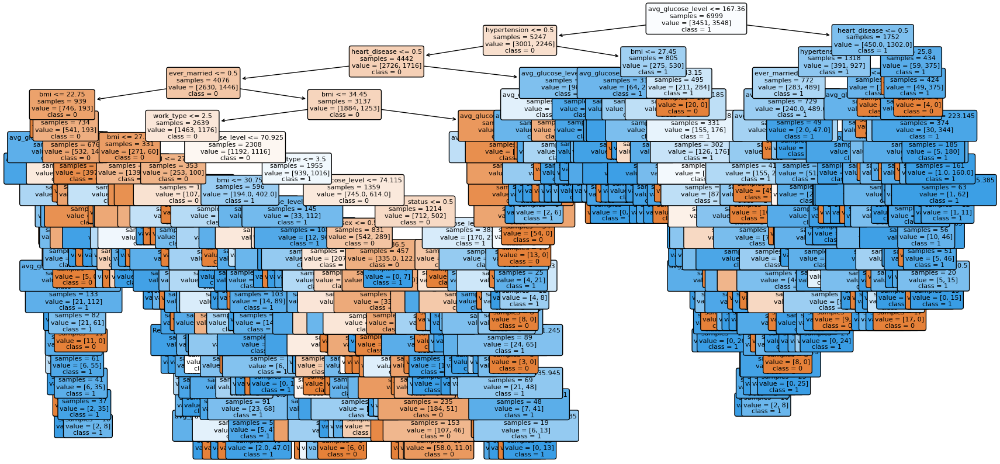

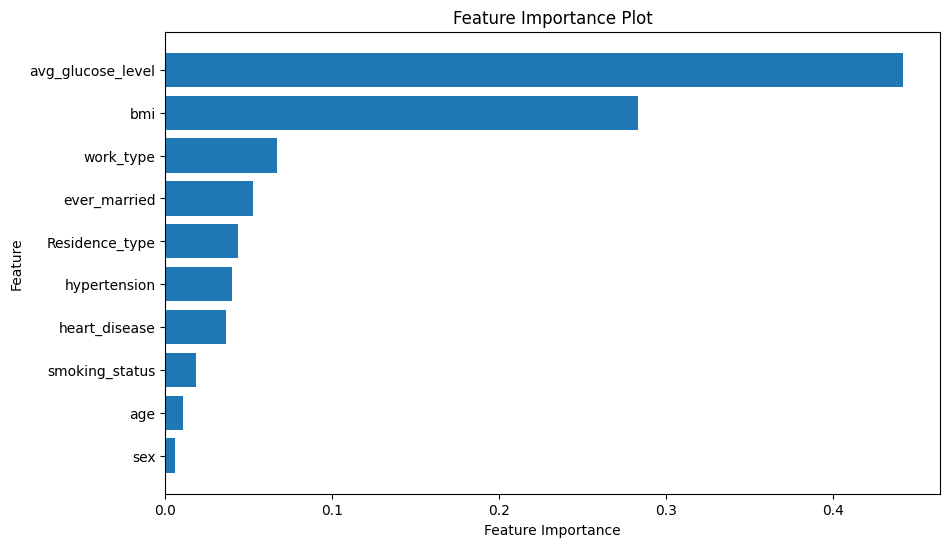

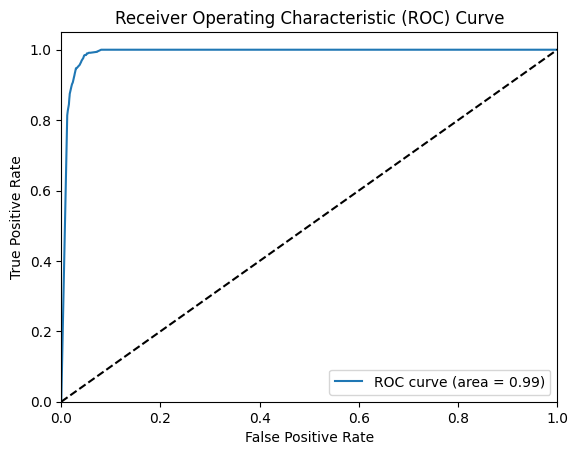

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


AUC Score: 0.9900437087417483
Accuracy for each fold: [0.9457142857142857, 0.9471428571428572, 0.9485714285714286, 0.9357142857142857, 0.95, 0.9185714285714286, 0.96, 0.9371428571428572, 0.9357142857142857, 0.932761087267525]
Mean accuracy: 0.9411332515838954
95% confidence interval: (0.9328703244780197, 0.9493961786897711)


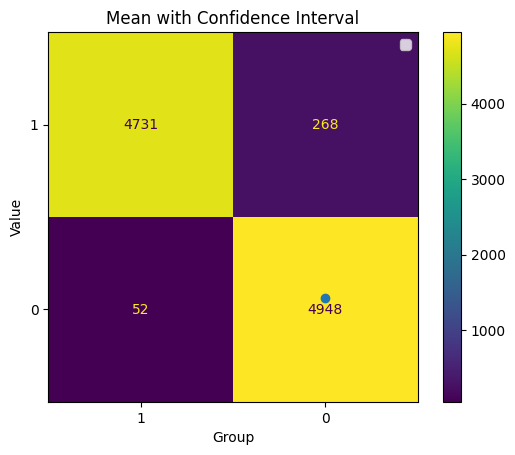


 PRINT HGB PREDICTIONS AND RESULTS
---------------------------------------------------
Fitting 5 folds for each of 50 candidates, totalling 250 fits
search time: 35.78738760948181
Best parameters found:  {'l2_regularization': 0.3, 'learning_rate': 0.3, 'max_depth': 6, 'max_iter': 216, 'min_samples_leaf': 3}
Best score on training data:  1.0
Classification Report on Training Set - dirty:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3451
           1       1.00      1.00      1.00      3548

    accuracy                           1.00      6999
   macro avg       1.00      1.00      1.00      6999
weighted avg       1.00      1.00      1.00      6999

Classification Report on Test Set - dirty:
              precision    recall  f1-score   support

           0       1.00      0.98      0.99      1548
           1       0.98      1.00      0.99      1452

    accuracy                           0.99      3000
   macro avg       0.

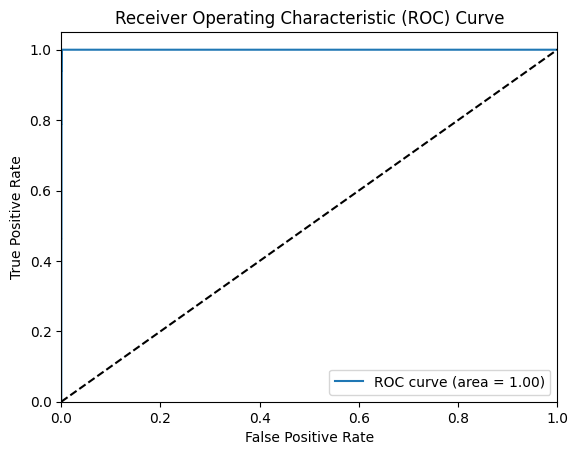

AUC Score: 0.9995357471494298


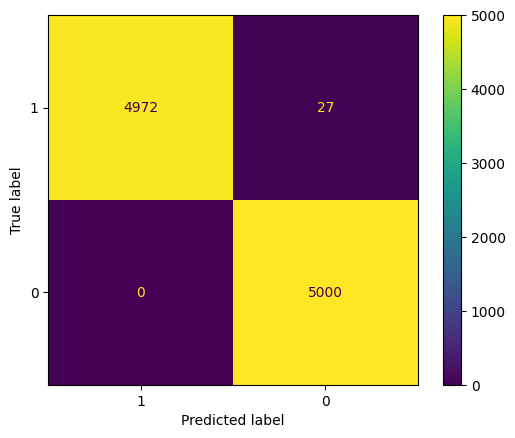

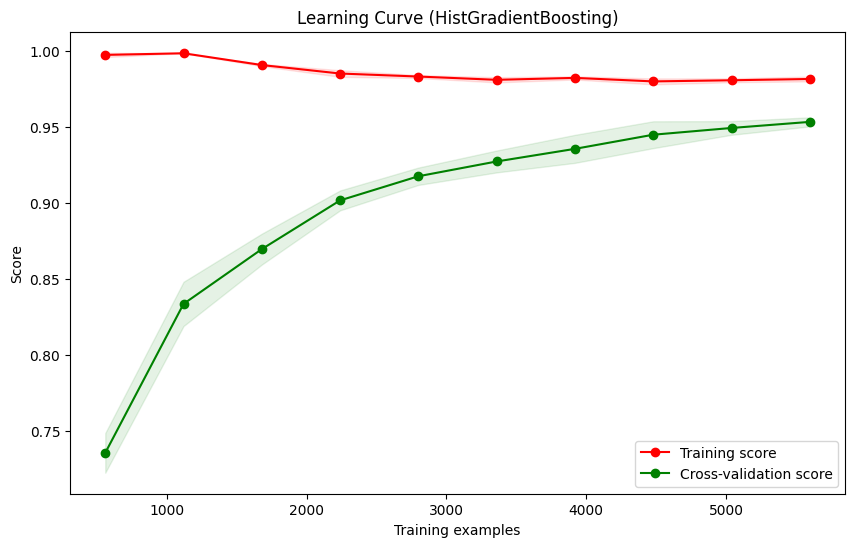

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Accuracy for each fold: [0.9885714285714285, 0.9914285714285714, 0.9757142857142858, 0.9885714285714285, 0.9857142857142858, 0.99, 0.9914285714285714, 0.9885714285714285, 0.9928571428571429, 0.9856938483547926]
Mean accuracy: 0.9878550991211934
95% confidence interval: (0.9843721175871484, 0.9913380806552384)


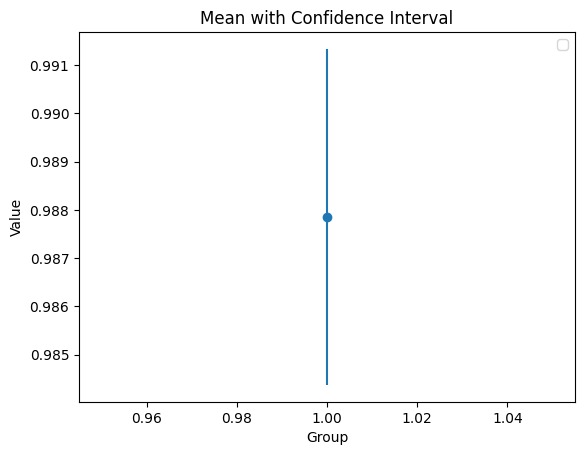

In [11]:
print('ADDING 50% TO FEATURE: SMOKING_STATUS')
print('--------------------------------------')
indices, original_values = null_utility.add_null_values(df,'smoking_status', 50)
print('\n DECISION TREE PREDICTIONS AND RESULTS')
print('---------------------------------------------------')
decision_tree = ML_algorithms.train_decision_tree_model(df, df_to_test)
ML_algorithms.k_fold_cross_validation_dt(decision_tree,df)
    
print('\n PRINT HGB PREDICTIONS AND RESULTS')
print('---------------------------------------------------')
hgb = ML_algorithms.train_hist_gradient_boosting_model(df, df_to_test)
ML_algorithms.k_fold_cross_validation_dt(hgb,df) 
    
df.loc[indices, 'smoking_status'] = original_values

Inserting 50% of null values in the two most important features together (bmi, avg_glucose_level)

Total rows: 9999
Null Value Counts:
sex                     0
age                     0
hypertension            0
heart_disease           0
ever_married            0
work_type               0
Residence_type          0
avg_glucose_level    4999
bmi                  4999
smoking_status          0
stroke                  0
dtype: int64

Percentage of Null Values:
sex                   0.000000
age                   0.000000
hypertension          0.000000
heart_disease         0.000000
ever_married          0.000000
work_type             0.000000
Residence_type        0.000000
avg_glucose_level    49.994999
bmi                  49.994999
smoking_status        0.000000
stroke                0.000000
dtype: float64

Feature: sex
Null Count: 0
Null Percentage: 0.00%

Feature: age
Null Count: 0
Null Percentage: 0.00%

Feature: hypertension
Null Count: 0
Null Percentage: 0.00%

Feature: heart_disease
Null Count: 0
Null Percentage: 0.00%

Feature: ever_married
Null Count: 0
Null Percentage: 0.00

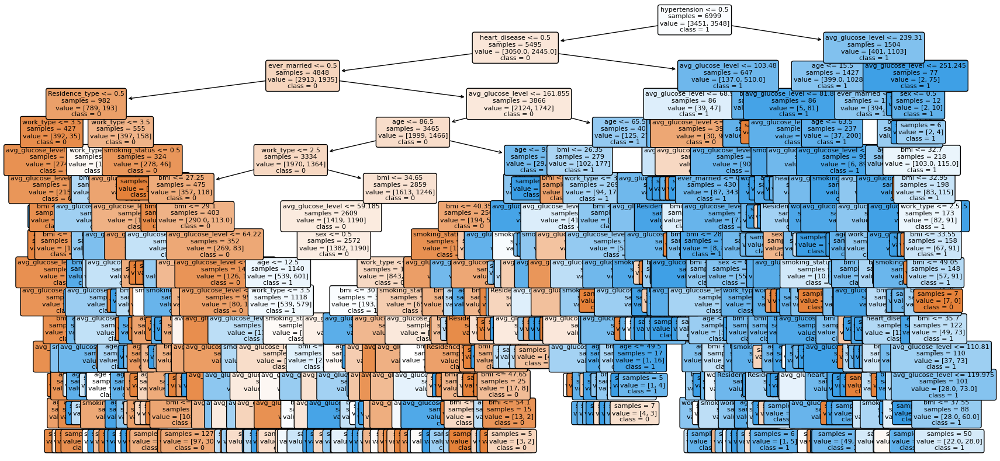

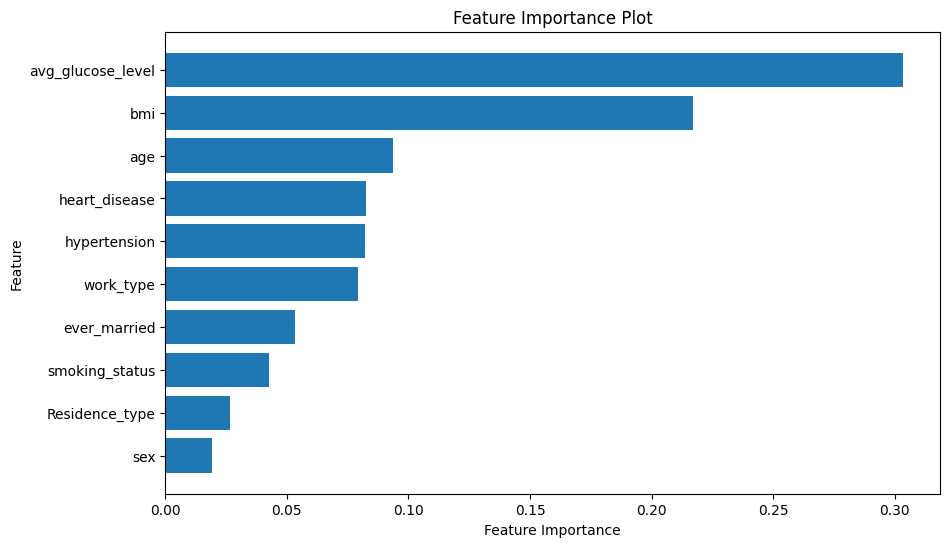

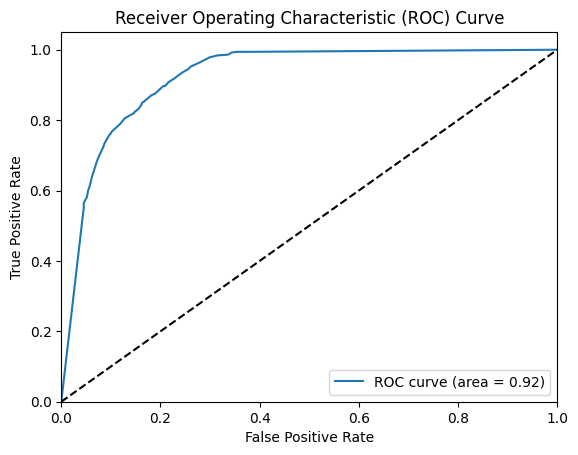

AUC Score: 0.9233423684736948


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Accuracy for each fold: [0.7571428571428571, 0.7657142857142857, 0.7314285714285714, 0.75, 0.7385714285714285, 0.7528571428571429, 0.76, 0.7628571428571429, 0.7385714285714285, 0.7381974248927039]
Mean accuracy: 0.7495340282035561
95% confidence interval: (0.7408880998868503, 0.7581799565202618)


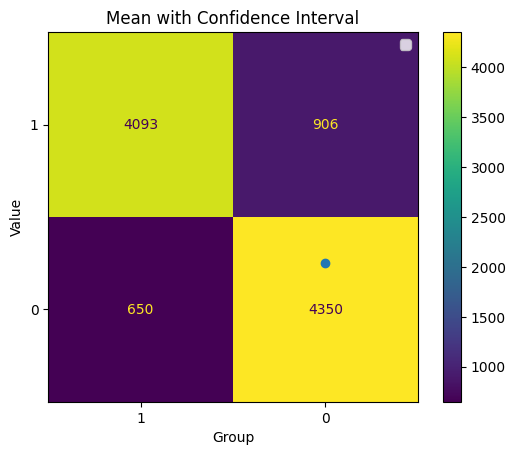


 HGB PREDICTIONS AND RESULTS
---------------------------------------------------
Fitting 5 folds for each of 50 candidates, totalling 250 fits
search time: 33.1330988407135
Best parameters found:  {'l2_regularization': 0.0, 'learning_rate': 0.3, 'max_depth': 9, 'max_iter': 177, 'min_samples_leaf': 1}
Best score on training data:  0.8621720733427363
Classification Report on Training Set - dirty:
              precision    recall  f1-score   support

           0       0.95      0.96      0.95      3451
           1       0.96      0.95      0.95      3548

    accuracy                           0.95      6999
   macro avg       0.95      0.95      0.95      6999
weighted avg       0.95      0.95      0.95      6999

Classification Report on Test Set - dirty:
              precision    recall  f1-score   support

           0       0.86      0.84      0.85      1548
           1       0.83      0.85      0.84      1452

    accuracy                           0.84      3000
   macro avg 

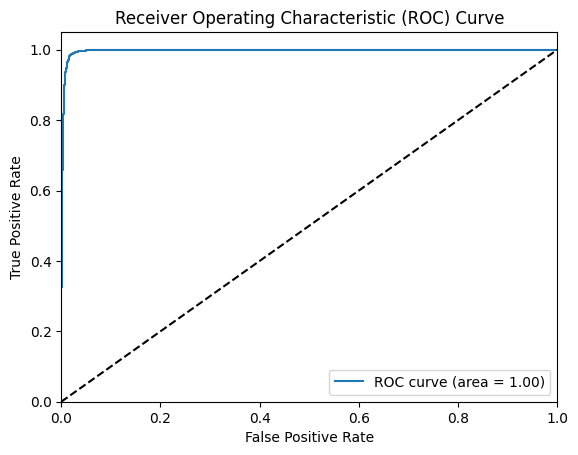

AUC Score: 0.9970154030806161


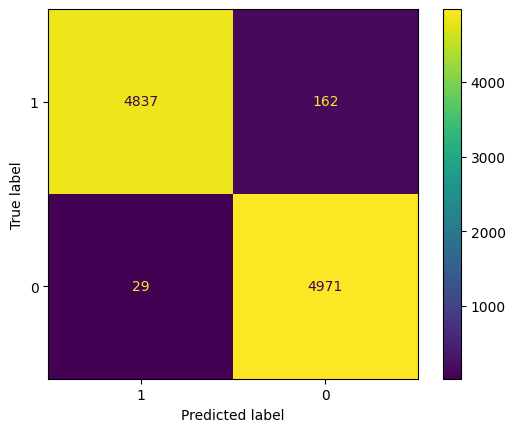

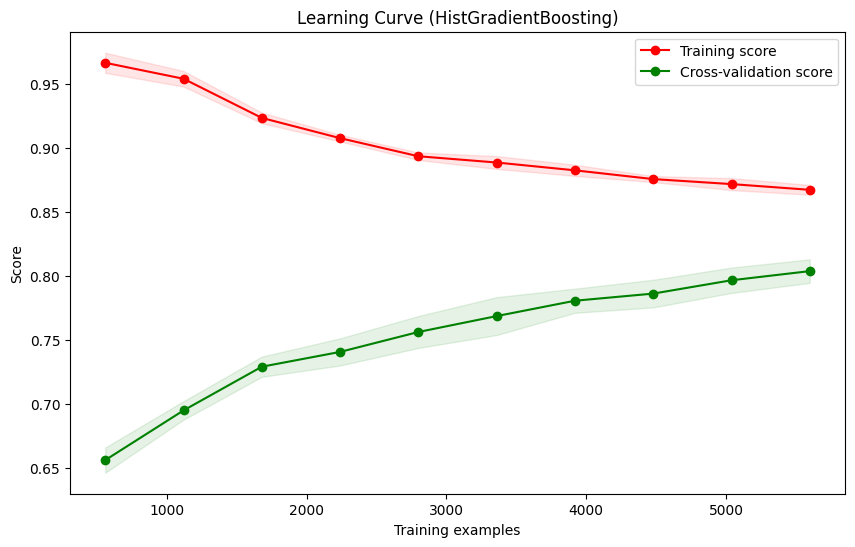

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Accuracy for each fold: [0.8442857142857143, 0.8471428571428572, 0.83, 0.8585714285714285, 0.8371428571428572, 0.8428571428571429, 0.8485714285714285, 0.8514285714285714, 0.8357142857142857, 0.8383404864091559]
Mean accuracy: 0.843405477212344
95% confidence interval: (0.8373738006187085, 0.8494371538059796)


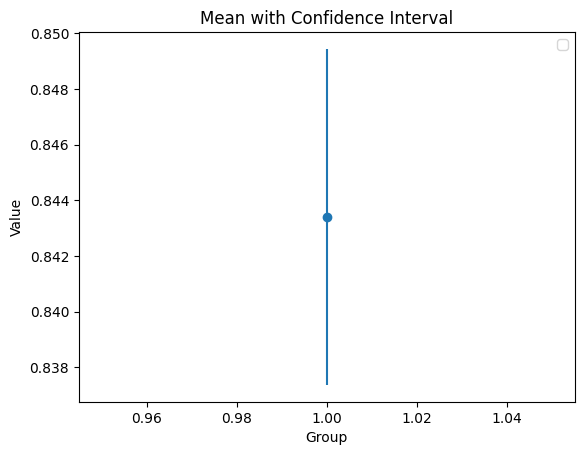

In [12]:
indices_dict = {}
original_values_dict = {}
features = [ 'bmi', 'avg_glucose_level']

for feature in features:
    indices, original_values = null_utility.add_null_values(df,feature,50)
    indices_dict[feature] = indices
    original_values_dict[feature] = original_values

null_utility.print_null_values(df)

print('\n DECISION TREE PREDICTIONS AND RESULTS')
print('---------------------------------------------------')
decision_tree = ML_algorithms.train_decision_tree_model(df,df_to_test)
ML_algorithms.k_fold_cross_validation_dt(decision_tree,df)

print('\n HGB PREDICTIONS AND RESULTS')
print('---------------------------------------------------')
hgb = ML_algorithms.train_hist_gradient_boosting_model(df, df_to_test)
ML_algorithms.k_fold_cross_validation_dt(hgb,df)

for feature in features:
    df.loc[indices_dict[feature], feature] = original_values_dict[feature]

Inserting 50% of null values in the two less important features

Total rows: 9999
Null Value Counts:
sex                  4999
age                  4999
hypertension            0
heart_disease           0
ever_married            0
work_type               0
Residence_type          0
avg_glucose_level       0
bmi                     0
smoking_status          0
stroke                  0
dtype: int64

Percentage of Null Values:
sex                  49.994999
age                  49.994999
hypertension          0.000000
heart_disease         0.000000
ever_married          0.000000
work_type             0.000000
Residence_type        0.000000
avg_glucose_level     0.000000
bmi                   0.000000
smoking_status        0.000000
stroke                0.000000
dtype: float64

Feature: sex
Null Count: 4999
Null Percentage: 49.99%

Feature: age
Null Count: 4999
Null Percentage: 49.99%

Feature: hypertension
Null Count: 0
Null Percentage: 0.00%

Feature: heart_disease
Null Count: 0
Null Percentage: 0.00%

Feature: ever_married
Null Count: 0
Null Percenta

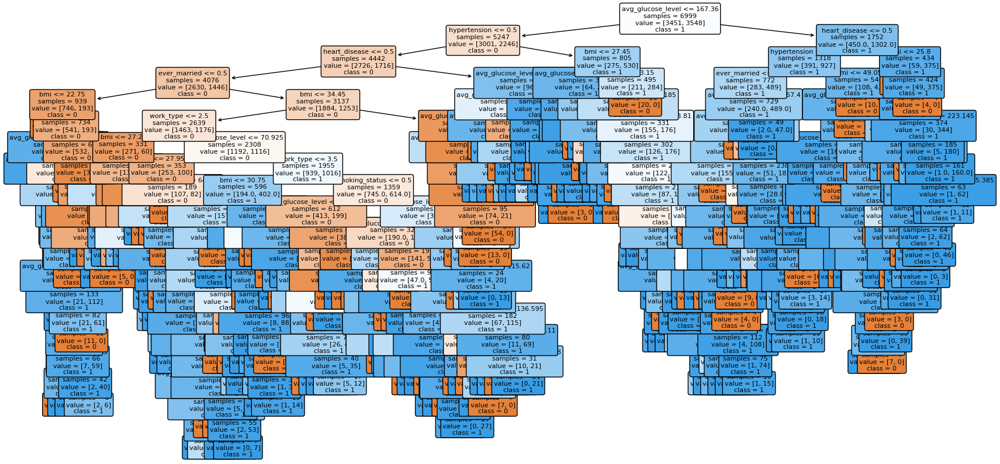

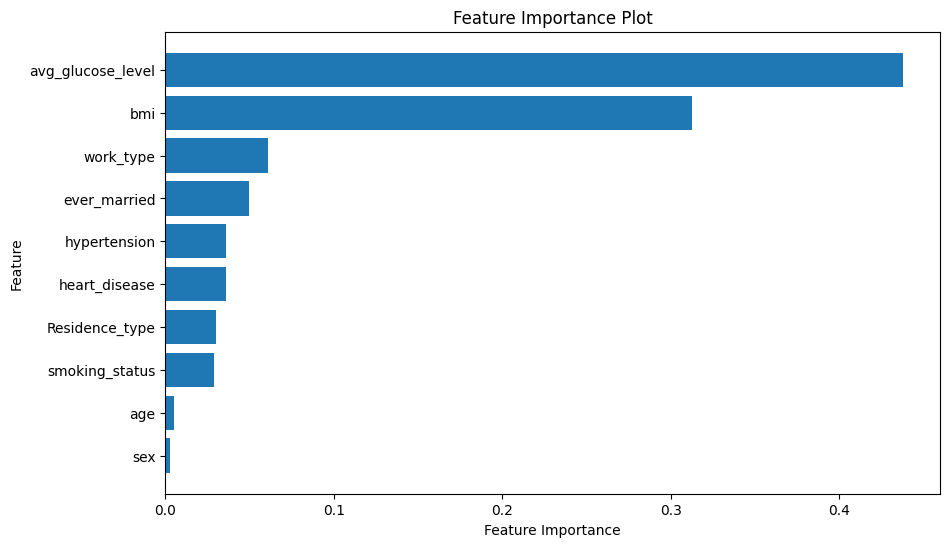

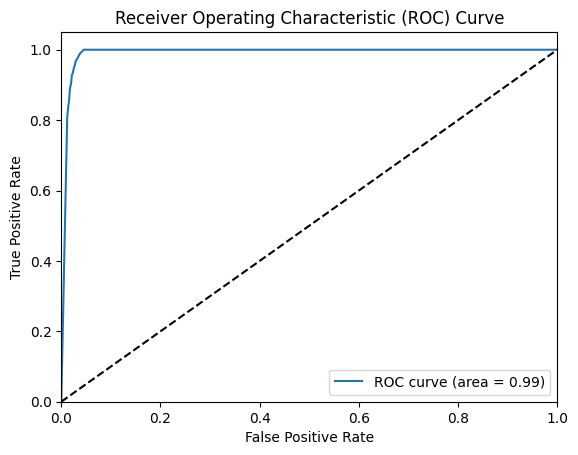

AUC Score: 0.9910051210242048


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Accuracy for each fold: [0.95, 0.9614285714285714, 0.9657142857142857, 0.9642857142857143, 0.9485714285714286, 0.9528571428571428, 0.9457142857142857, 0.9628571428571429, 0.97, 0.9470672389127325]
Mean accuracy: 0.9568495810341304
95% confidence interval: (0.9504737406286816, 0.9632254214395792)


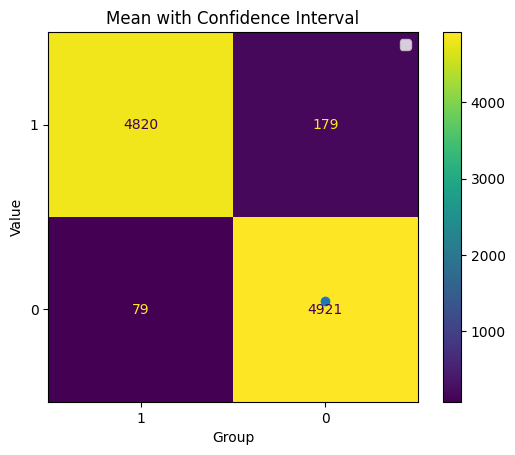


 HGB PREDICTIONS AND RESULTS
---------------------------------------------------
Fitting 5 folds for each of 50 candidates, totalling 250 fits
search time: 27.996018171310425
Best parameters found:  {'l2_regularization': 0.3, 'learning_rate': 0.2, 'max_depth': 8, 'max_iter': 337, 'min_samples_leaf': 8}
Best score on training data:  1.0
Classification Report on Training Set - dirty:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3451
           1       1.00      1.00      1.00      3548

    accuracy                           1.00      6999
   macro avg       1.00      1.00      1.00      6999
weighted avg       1.00      1.00      1.00      6999

Classification Report on Test Set - dirty:
              precision    recall  f1-score   support

           0       1.00      0.99      0.99      1548
           1       0.99      1.00      0.99      1452

    accuracy                           0.99      3000
   macro avg       0.99   

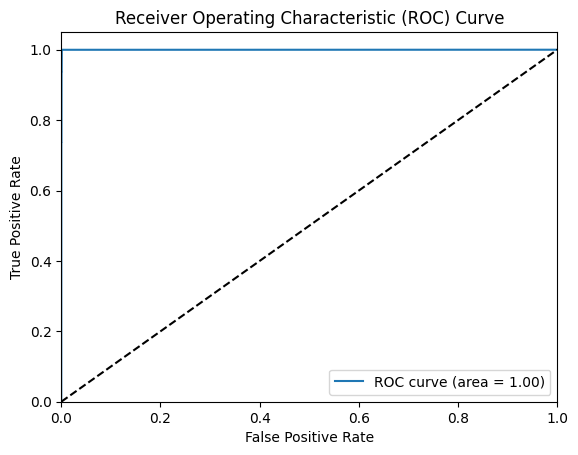

AUC Score: 0.9996741348269654


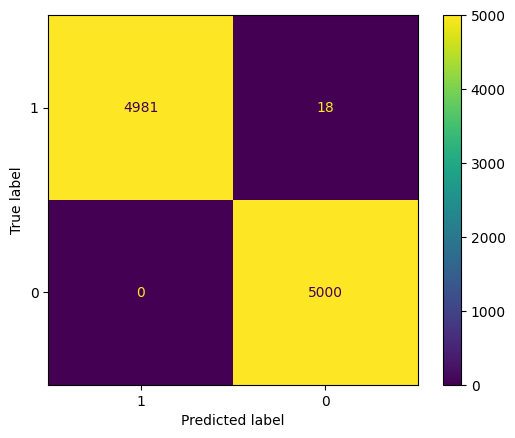

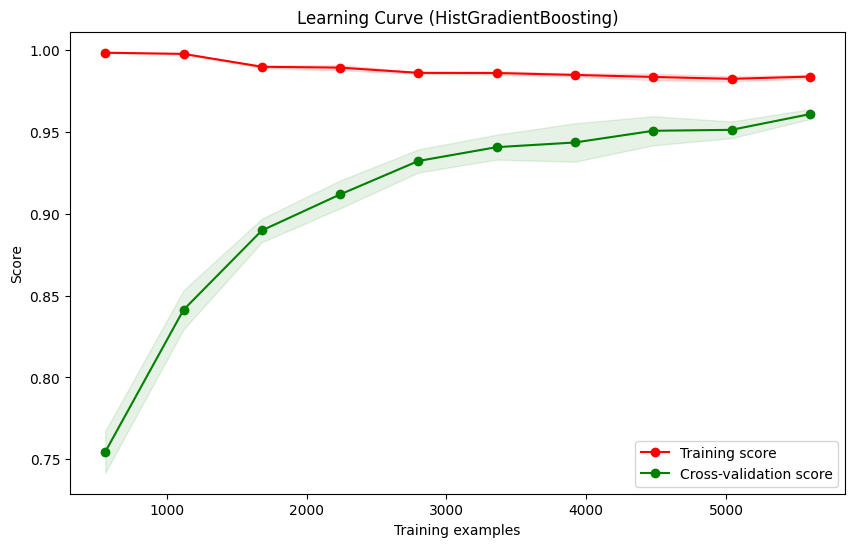

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Accuracy for each fold: [0.9914285714285714, 0.9842857142857143, 0.9828571428571429, 0.9957142857142857, 0.9814285714285714, 0.9842857142857143, 0.9914285714285714, 0.9928571428571429, 0.9885714285714285, 0.9871244635193133]
Mean accuracy: 0.9879981606376458
95% confidence interval: (0.9845846278957304, 0.9914116933795611)


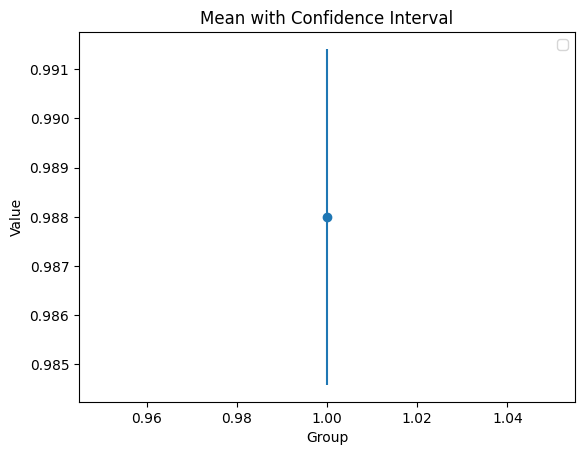

In [15]:
indices_dict = {}
original_values_dict = {}
features = [ 'sex', 'age']

for feature in features:
    indices, original_values = null_utility.add_null_values(df, feature, 50)
    indices_dict[feature] = indices
    original_values_dict[feature] = original_values

null_utility.print_null_values(df)

print('\n DECISION TREE PREDICTIONS AND RESULTS')
print('---------------------------------------------------')
decision_tree = ML_algorithms.train_decision_tree_model(df,df_to_test)
ML_algorithms.k_fold_cross_validation_dt(decision_tree,df)

print('\n HGB PREDICTIONS AND RESULTS')
print('---------------------------------------------------')
hgb = ML_algorithms.train_hist_gradient_boosting_model(df, df_to_test)
ML_algorithms.k_fold_cross_validation_dt(hgb,df)

for feature in features:
    df.loc[indices_dict[feature], feature] = original_values_dict[feature]

Inserting 50% of null values in health related features (avg_glucose_level, bmi, hypertension, smoking_status, heart_disease, age)

Total rows: 9999
Null Value Counts:
sex                     0
age                  4999
hypertension         4999
heart_disease        4999
ever_married            0
work_type               0
Residence_type          0
avg_glucose_level    4999
bmi                  4999
smoking_status       4999
stroke                  0
dtype: int64

Percentage of Null Values:
sex                   0.000000
age                  49.994999
hypertension         49.994999
heart_disease        49.994999
ever_married          0.000000
work_type             0.000000
Residence_type        0.000000
avg_glucose_level    49.994999
bmi                  49.994999
smoking_status       49.994999
stroke                0.000000
dtype: float64

Feature: sex
Null Count: 0
Null Percentage: 0.00%

Feature: age
Null Count: 4999
Null Percentage: 49.99%

Feature: hypertension
Null Count: 4999
Null Percentage: 49.99%

Feature: heart_disease
Null Count: 4999
Null Percentage: 49.99%

Feature: ever_married
Null Count: 0
Null Perc

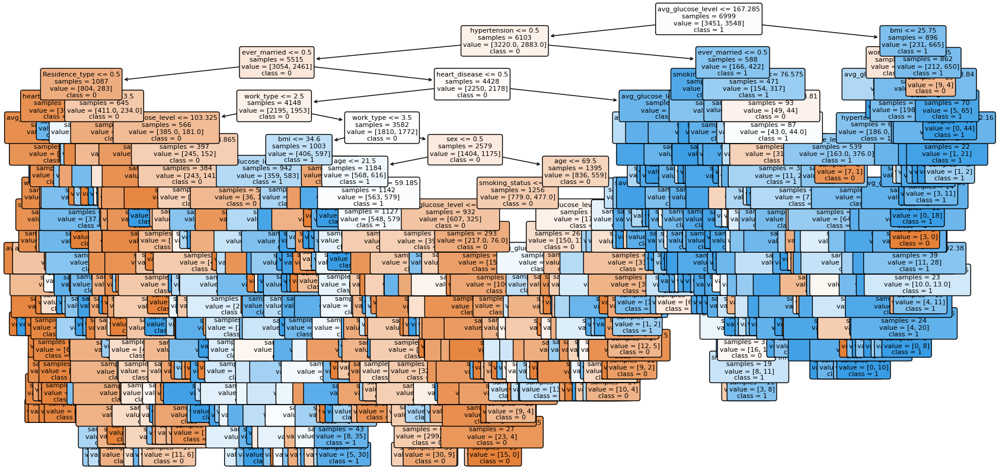

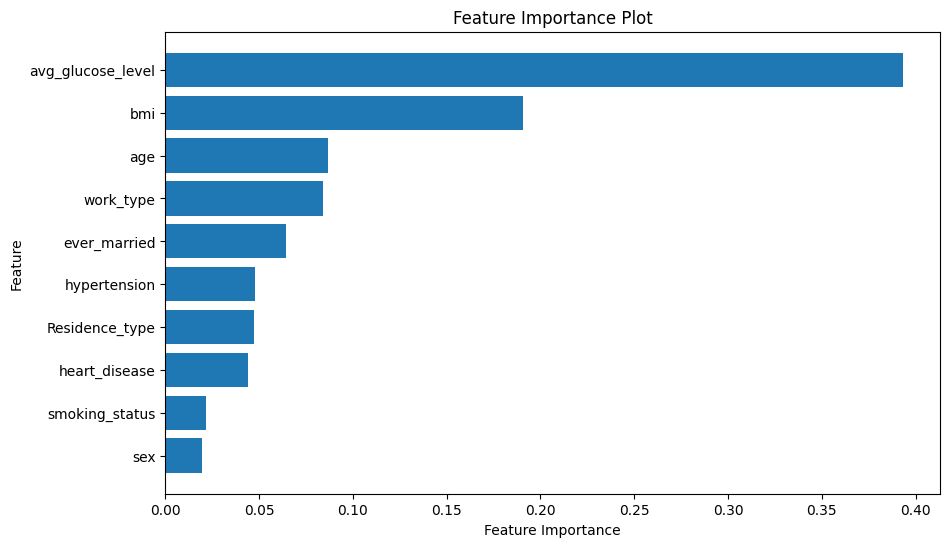

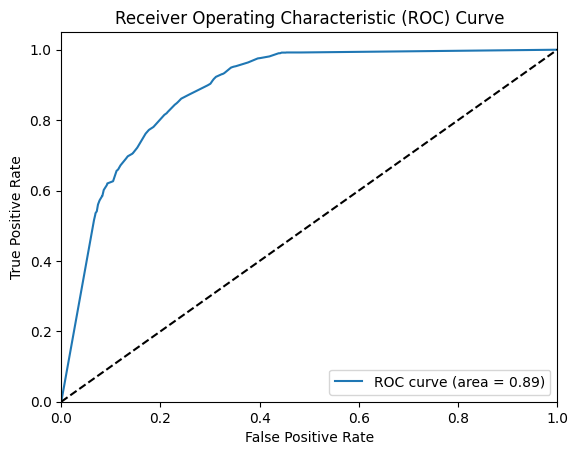

AUC Score: 0.8867373274654932


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Accuracy for each fold: [0.7085714285714285, 0.7285714285714285, 0.7142857142857143, 0.6957142857142857, 0.7371428571428571, 0.6785714285714286, 0.6585714285714286, 0.7142857142857143, 0.6714285714285714, 0.698140200286123]
Mean accuracy: 0.700528305742898
95% confidence interval: (0.6825438434759933, 0.7185127680098028)


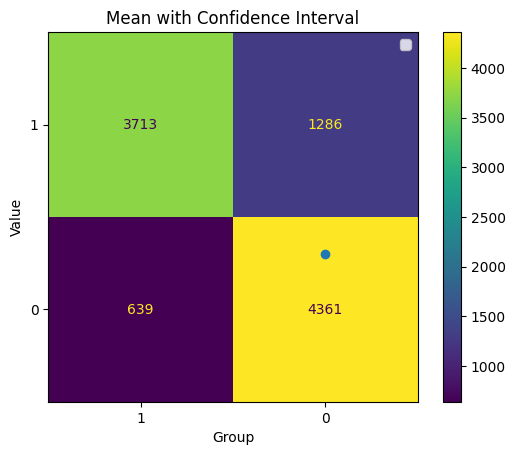


 HGB PREDICTIONS AND RESULTS
---------------------------------------------------
Fitting 5 folds for each of 50 candidates, totalling 250 fits
search time: 28.61202383041382
Best parameters found:  {'l2_regularization': 0.3, 'learning_rate': 0.2, 'max_depth': 8, 'max_iter': 320, 'min_samples_leaf': 1}
Best score on training data:  0.8184842766046208
Classification Report on Training Set - dirty:
              precision    recall  f1-score   support

           0       0.94      0.93      0.93      3451
           1       0.93      0.94      0.94      3548

    accuracy                           0.94      6999
   macro avg       0.94      0.94      0.94      6999
weighted avg       0.94      0.94      0.94      6999

Classification Report on Test Set - dirty:
              precision    recall  f1-score   support

           0       0.84      0.78      0.81      1548
           1       0.78      0.84      0.81      1452

    accuracy                           0.81      3000
   macro avg

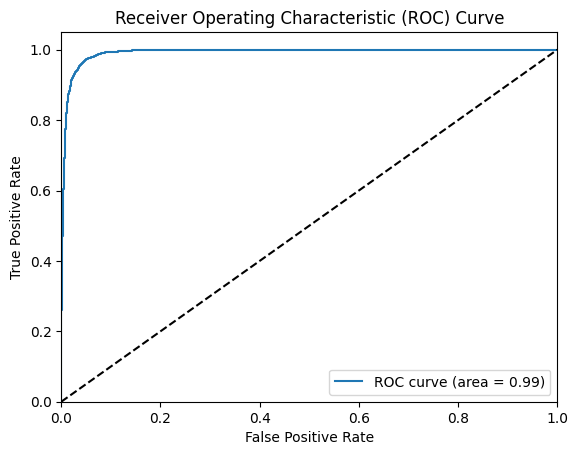

AUC Score: 0.9919040208041608


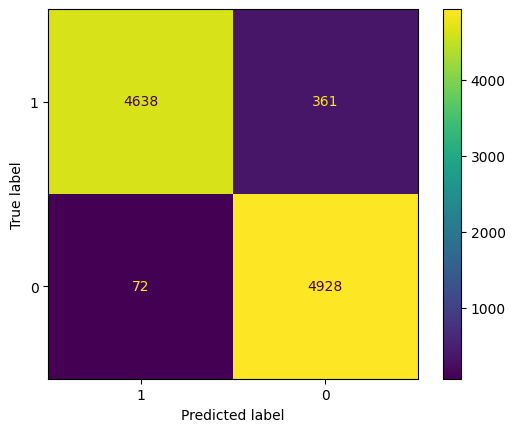

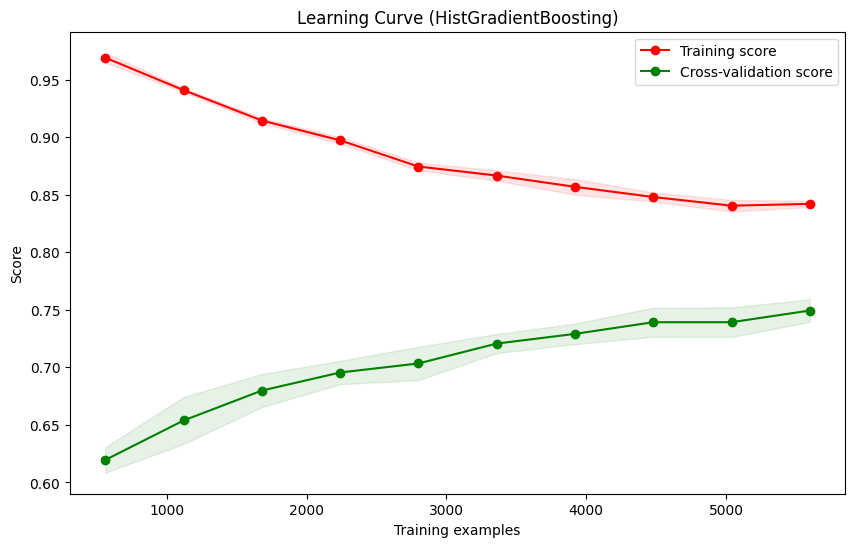

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Accuracy for each fold: [0.7942857142857143, 0.81, 0.7985714285714286, 0.7957142857142857, 0.8014285714285714, 0.8114285714285714, 0.8128571428571428, 0.7728571428571429, 0.81, 0.8054363376251789]
Mean accuracy: 0.8012579194768037
95% confidence interval: (0.7926554895139184, 0.809860349439689)


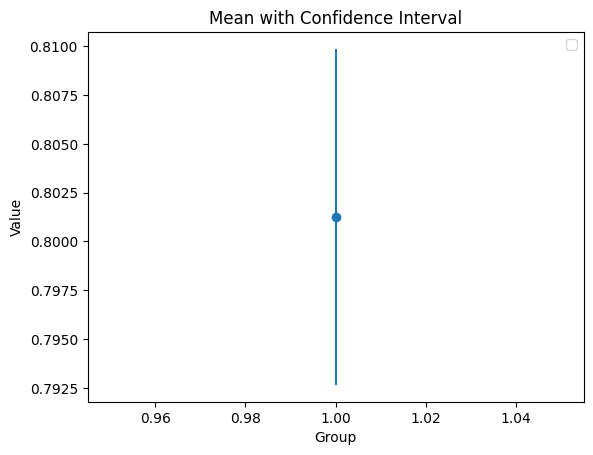

In [16]:
indices_dict = {}
original_values_dict = {}
features = [ 'avg_glucose_level', 'age', 'bmi', 'hypertension', 'smoking_status', 'heart_disease']

for feature in features:
    indices, original_values = null_utility.add_null_values(df, feature, 50)
    indices_dict[feature] = indices
    original_values_dict[feature] = original_values

null_utility.print_null_values(df)

print('\n DECISION TREE PREDICTIONS AND RESULTS')
print('---------------------------------------------------')
decision_tree = ML_algorithms.train_decision_tree_model(df,df_to_test)
ML_algorithms.k_fold_cross_validation_dt(decision_tree,df)

print('\n HGB PREDICTIONS AND RESULTS')
print('---------------------------------------------------')
hgb = ML_algorithms.train_hist_gradient_boosting_model(df, df_to_test)
ML_algorithms.k_fold_cross_validation_dt(hgb,df)

for feature in features:
    df.loc[indices_dict[feature], feature] = original_values_dict[feature]

inserting 50% of null values in NOT health related features (sex, residence_type, ever_married, work_type)

Total rows: 9999
Null Value Counts:
sex                  4999
age                     0
hypertension            0
heart_disease           0
ever_married         4999
work_type            4999
Residence_type       4999
avg_glucose_level       0
bmi                     0
smoking_status          0
stroke                  0
dtype: int64

Percentage of Null Values:
sex                  49.994999
age                   0.000000
hypertension          0.000000
heart_disease         0.000000
ever_married         49.994999
work_type            49.994999
Residence_type       49.994999
avg_glucose_level     0.000000
bmi                   0.000000
smoking_status        0.000000
stroke                0.000000
dtype: float64

Feature: sex
Null Count: 4999
Null Percentage: 49.99%

Feature: age
Null Count: 0
Null Percentage: 0.00%

Feature: hypertension
Null Count: 0
Null Percentage: 0.00%

Feature: heart_disease
Null Count: 0
Null Percentage: 0.00%

Feature: ever_married
Null Count: 4999
Null Percentag

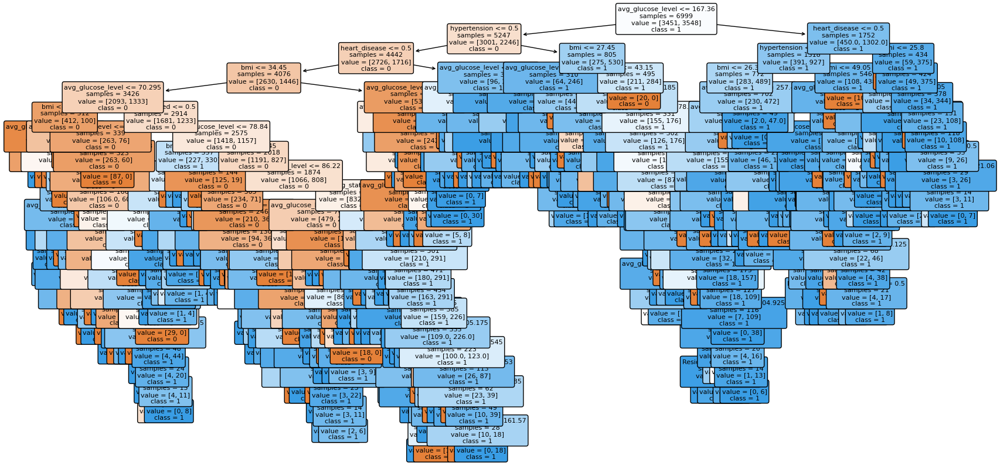

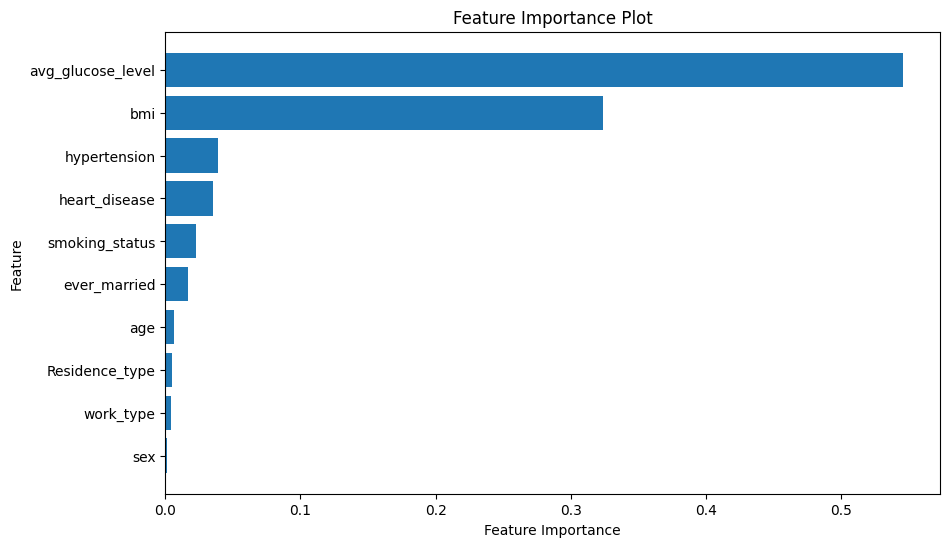

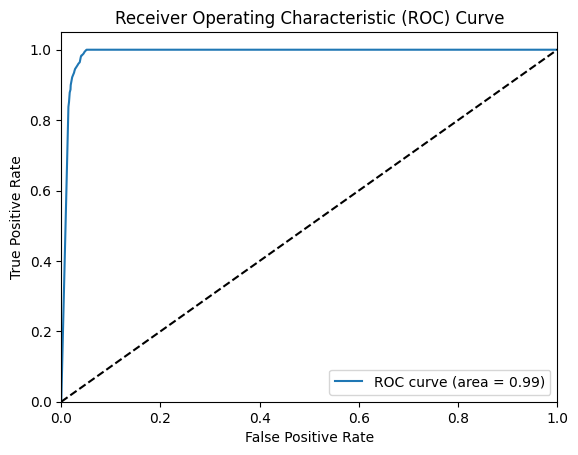

AUC Score: 0.9897726745349069


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Accuracy for each fold: [0.9385714285714286, 0.94, 0.9271428571428572, 0.9257142857142857, 0.9357142857142857, 0.9257142857142857, 0.9571428571428572, 0.9371428571428572, 0.9428571428571428, 0.9399141630901288]
Mean accuracy: 0.9369914163090127
95% confidence interval: (0.9301899923374568, 0.9437928402805686)


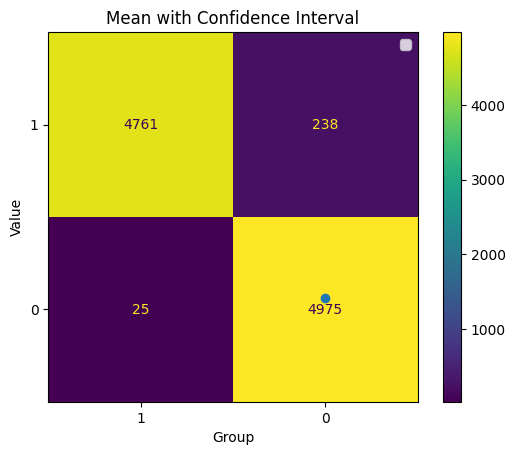


 HGB PREDICTIONS AND RESULTS
---------------------------------------------------
Fitting 5 folds for each of 50 candidates, totalling 250 fits
search time: 30.182974815368652
Best parameters found:  {'l2_regularization': 0.1, 'learning_rate': 0.3, 'max_depth': 4, 'max_iter': 496, 'min_samples_leaf': 3}
Best score on training data:  1.0
Classification Report on Training Set - dirty:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3451
           1       1.00      1.00      1.00      3548

    accuracy                           1.00      6999
   macro avg       1.00      1.00      1.00      6999
weighted avg       1.00      1.00      1.00      6999

Classification Report on Test Set - dirty:
              precision    recall  f1-score   support

           0       1.00      0.98      0.99      1548
           1       0.98      1.00      0.99      1452

    accuracy                           0.99      3000
   macro avg       0.99   

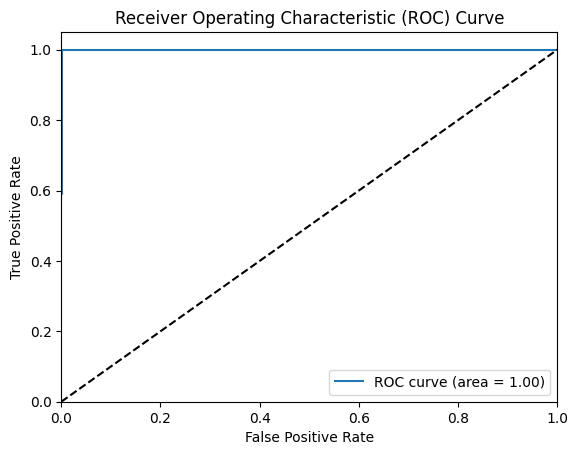

AUC Score: 0.9995640328065613


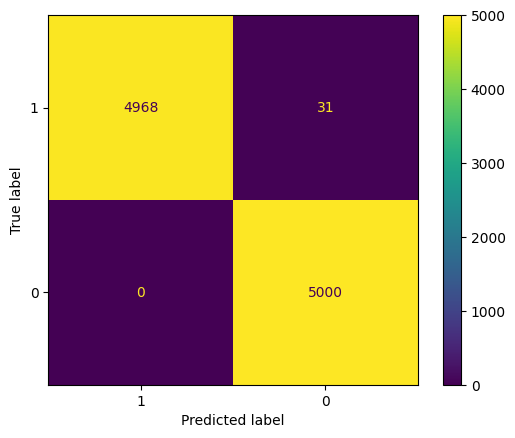

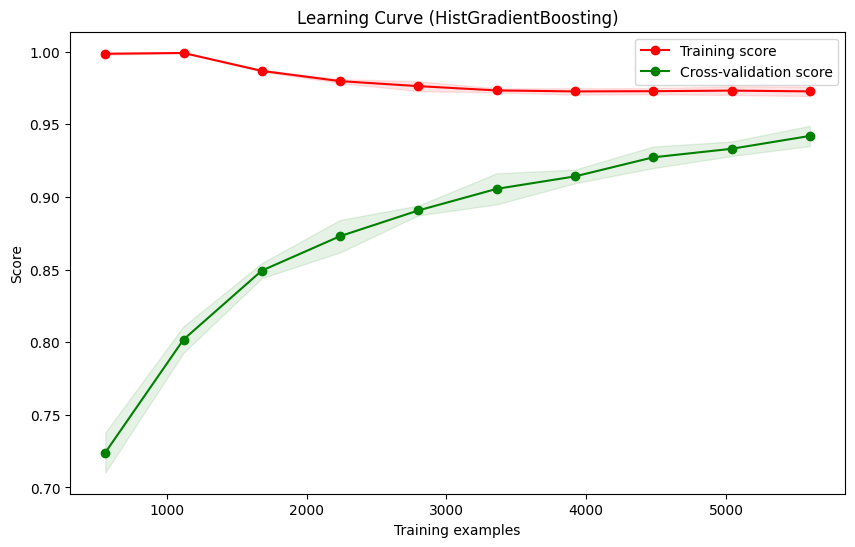

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Accuracy for each fold: [0.9785714285714285, 0.98, 0.9857142857142858, 0.9785714285714285, 0.9828571428571429, 0.9857142857142858, 0.9771428571428571, 0.9828571428571429, 0.9828571428571429, 0.9756795422031473]
Mean accuracy: 0.9809965256488862
95% confidence interval: (0.9784868048256234, 0.9835062464721489)


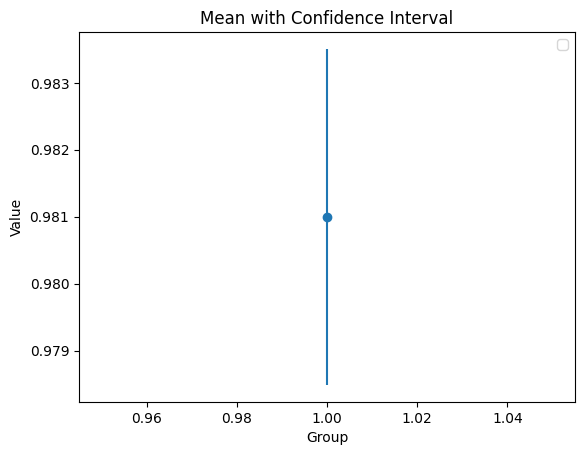

In [17]:
indices_dict = {}
original_values_dict = {}
features = [ 'sex', 'Residence_type', 'ever_married', 'work_type']

for feature in features:
    indices, original_values = null_utility.add_null_values(df, feature, 50)
    indices_dict[feature] = indices
    original_values_dict[feature] = original_values

null_utility.print_null_values(df)

print('\n DECISION TREE PREDICTIONS AND RESULTS')
print('---------------------------------------------------')

decision_tree = ML_algorithms.train_decision_tree_model(df,df_to_test)
ML_algorithms.k_fold_cross_validation_dt(decision_tree,df)

print('\n HGB PREDICTIONS AND RESULTS')
print('---------------------------------------------------')
hgb = ML_algorithms.train_hist_gradient_boosting_model(df, df_to_test)
ML_algorithms.k_fold_cross_validation_dt(hgb,df)

for feature in features:
    df.loc[indices_dict[feature], feature] = original_values_dict[feature]